# **Feynman Lectures on Physics**

Equation I.12.11 - Fundamental forces, fields.

$$
\begin{equation}
    F = q*(E_f + Bv\sin(\theta))
\end{equation}
$$

Equation I.50.26 - Nonlinear responses

$$
\begin{equation}
    x = x_1(\cos(\omega t) + \alpha \cos(\omega t)^2)
\end{equation}
$$




<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


F > 0: True
observations_I_12_11.min() = 1.0000007360267458


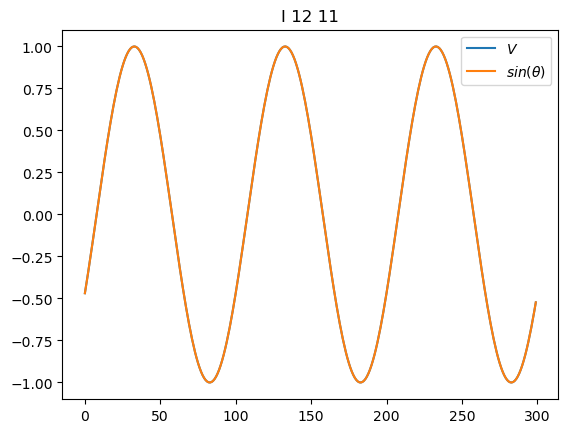

observations_I_50_26.min() = -0.5808574284145132


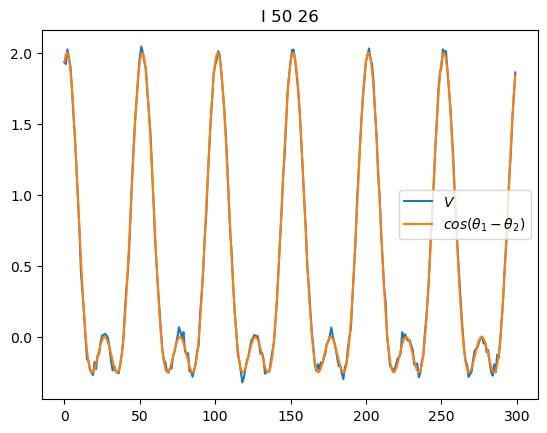

'\ntheta_1, observations_tVec_II_6_15b = np.zeros((nSys, nSamples, 1)), np.zeros((nSys, nSamples, 1))\nfor s in range(nSys):\n    observations_tVec_II_6_15b[s,:,0] = tVec\n    theta_1[s,:,0] = 2*np.pi*0.5*f*tVec + 2*np.pi*np.random.rand()\n    #theta_2[s,:,0] = 2*np.pi*1.5*f*tVec + 2*np.pi*np.random.rand()\nepsilon, Pd, r = 1+np.random.rand(nSys, nSamples, 1), 1+np.random.rand(nSys, nSamples, 1), 1+np.random.rand(nSys, nSamples, 1)\nEf = 3/(4*np.pi*epsilon)*(Pd/np.power(r, 3))*np.cos(theta_1)*np.sin(theta_1)\nobservations_II_6_15b = np.concatenate((Ef,epsilon,Pd,r), axis=2)\nV_II_6_15b = Ef/(3/(4*np.pi*epsilon)*(Pd/np.power(r, 3)))\n'

In [1]:
#!pip install torchsde
import torch
from torch import nn
import numpy as np
import sys
import matplotlib.pyplot as plt
import torchsde
from scipy import interpolate

nSys = 100
nSamples = 300
fs = 100 #hz
f = 1 # hz
tVec = np.arange(nSamples)/fs
theta, observations_tVec_I_12_11 = np.zeros((nSys, nSamples, 1)), np.zeros((nSys, nSamples, 1))
for s in range(nSys):
    observations_tVec_I_12_11[s,:,0] = tVec
    theta[s,:,0] = 2*np.pi*f*tVec + 2*np.pi*np.random.rand()
q, Ef, B, v = 1+np.random.rand(nSys, nSamples, 1), 10+np.random.rand(nSys, nSamples, 1), 1+np.random.rand(nSys, nSamples, 1), 1+np.random.rand(nSys, nSamples, 1)
F = q*(Ef + B*v*np.sin(theta))

print(f'F > 0: {(F>0).all()}')

observations_I_12_11 = np.concatenate((F,q,Ef,B,v), axis=2)
print(f'observations_I_12_11.min() = {observations_I_12_11.min()}')
V_I_12_11 = (F/q - Ef)/(B*v)
plt.figure()
plt.title('I 12 11')
plt.plot(V_I_12_11[0],label=r'$V$')
plt.plot(np.sin(theta[0]), label=r'$sin(\theta)$')
plt.legend()
plt.show()
#################################
theta_1, observations_tVec_I_50_26 = np.zeros((nSys, nSamples, 1)), np.zeros((nSys, nSamples, 1))
alpha = 1
for s in range(nSys):
    observations_tVec_I_50_26[s,:,0] = tVec
    theta_1[s,:,0] = 2*np.pi*2*f*tVec + 2*np.pi*np.random.rand()
x1 = 1+np.random.rand(nSys, nSamples, 1)
x = x1*(np.cos(theta_1) + alpha*np.power(np.cos(theta_1),2))

# adding noise to x:
x = x + (x.std()/30)*np.random.randn(*x.shape)

observations_I_50_26 = np.concatenate((x,x1), axis=2)
print(f'observations_I_50_26.min() = {observations_I_50_26.min()}')
V_I_50_26 = x/x1
plt.figure()
plt.title('I 50 26')
plt.plot(V_I_50_26[0],label=r'$V$')
plt.plot(np.cos(theta_1[0]) + alpha*np.power(np.cos(theta_1[0]),2), label=r'$cos(\theta_1-\theta_2)$')
plt.legend()
plt.show()
#################################
'''
theta_1, observations_tVec_II_6_15b = np.zeros((nSys, nSamples, 1)), np.zeros((nSys, nSamples, 1))
for s in range(nSys):
    observations_tVec_II_6_15b[s,:,0] = tVec
    theta_1[s,:,0] = 2*np.pi*0.5*f*tVec + 2*np.pi*np.random.rand()
    #theta_2[s,:,0] = 2*np.pi*1.5*f*tVec + 2*np.pi*np.random.rand()
epsilon, Pd, r = 1+np.random.rand(nSys, nSamples, 1), 1+np.random.rand(nSys, nSamples, 1), 1+np.random.rand(nSys, nSamples, 1)
Ef = 3/(4*np.pi*epsilon)*(Pd/np.power(r, 3))*np.cos(theta_1)*np.sin(theta_1)
observations_II_6_15b = np.concatenate((Ef,epsilon,Pd,r), axis=2)
V_II_6_15b = Ef/(3/(4*np.pi*epsilon)*(Pd/np.power(r, 3)))
'''


## Evaluating IRAS algorithm

We train the combination player on inputs originated from the observations and inputs generated by the shuffle player. The combination player's objective is to minimize the CR. It is trained using the SGD optimizer.

In [2]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Thu Sep 28 17:31:44 2023

@author: ron.teichner
"""

import torch
import torch.nn as nn
import time

class Combination_ANN(nn.Module):
  def __init__(self, mu, Sigma_minus_half, features2ShuffleTogether, playerPerPatient, learnThrProcess, dt):
        super(Combination_ANN, self).__init__()
        self.nAncestors = 10
        self.learnThrProcess = learnThrProcess
        self.detachMode = True
        self.dt = dt
        self.inputDim = Sigma_minus_half.shape[0]
        self.shuffleFactor = 100
        self.Sigma_minus_half = nn.parameter.Parameter(torch.tensor(Sigma_minus_half, dtype=torch.float), requires_grad=False)
        self.mu = nn.parameter.Parameter(torch.tensor(mu, dtype=torch.float), requires_grad=False)
        self.features2ShuffleTogetherLists = features2ShuffleTogether
        self.playerPerPatient = playerPerPatient
        self.shuffleCompleteDaughters = learnThrProcess
        self.dimLatent = 2
        self.simpleNets = True
        
        if self.learnThrProcess:
            
            #self.timeUpdate = nn.Sequential(nn.Linear(1, 1))
            if self.simpleNets:
                self.encoder = nn.Sequential(nn.Linear(self.nAncestors, self.dimLatent),
                                             nn.Tanh())

                self.decoder = nn.Sequential(nn.Linear(self.dimLatent, 1),
                                             nn.Sigmoid())

                self.timeUpdate = nn.Sequential(nn.Linear(self.dimLatent, self.dimLatent),
                                                nn.Tanh())
            else:
                self.encoder = nn.Sequential(nn.Linear(self.nAncestors, 32),
                                                  nn.LeakyReLU(),
                                                  #nn.Linear(64, 32),
                                                  #nn.ReLU(),
                                                  nn.Linear(32, 16),
                                                  nn.LeakyReLU(),
                                                  nn.Linear(16, self.dimLatent),
                                                  nn.Tanh())
                self.decoder = nn.Sequential(nn.Linear(self.dimLatent, 32),
                                                  nn.LeakyReLU(),
                                                  #nn.Linear(64, 32),
                                                  #nn.ReLU(),
                                                  nn.Linear(32, 16),
                                                  nn.LeakyReLU(),
                                                  nn.Linear(16, 1),
                                                  nn.Sigmoid())
                self.timeUpdate = nn.Sequential(nn.Linear(self.dimLatent, 32),
                                                  nn.LeakyReLU(),
                                                  #nn.Linear(64, 32),
                                                  #nn.ReLU(),
                                                  nn.Linear(32, 16),
                                                  nn.LeakyReLU(),
                                                  nn.Linear(16, self.dimLatent),
                                                  nn.Tanh())

                
            '''
            self.timeUpdate = nn.Sequential(nn.Linear(self.nAncestors+2, 32),
                                                      nn.LeakyReLU(),
                                                      #nn.Linear(64, 32),
                                                      #nn.ReLU(),
                                                      nn.Linear(32, 16),
                                                      nn.LeakyReLU(),
                                                      nn.Linear(16, 1),
                                                      nn.Sigmoid())
            '''
                                                      
            
            
            

        
        self.sequence = nn.Sequential(nn.Linear(self.inputDim, 32),
                                                  nn.LeakyReLU(),
                                                  #nn.Linear(64, 32),
                                                  #nn.ReLU(),
                                                  nn.Linear(32, 16),
                                                  nn.LeakyReLU(),
                                                  nn.Linear(16, 1),
                                                  nn.Sigmoid())

            
        
  def shuffle(self, observations):
    naiveShuffledObservations = torch.zeros_like(observations)
    if self.shuffleCompleteDaughters:
        if not self.playerPerPatient:
            permuteSystemIdx = torch.randperm(observations.shape[0])#torch.randint_like(input=observations, low=0, high=observations.shape[0], dtype=torch.int64)
            permuteTimeIdx = torch.randperm(observations.shape[1])#torch.randint_like(input=observations, low=0, high=observations.shape[1], dtype=torch.int64)

            systemPermutedObservations = observations[permuteSystemIdx]#torch.gather(input=observations, dim=0, index=permuteSystemIdx)
            timeSystemPermutedObservations = systemPermutedObservations[:,permuteTimeIdx]#torch.gather(input=systemPermutedObservations, dim=1, index=permuteTimeIdx)
            naiveShuffledObservations[:,:] = timeSystemPermutedObservations[:,:]
        else:
            for s in range(observations.shape[0]):
                permuteIdx = torch.randperm(observations.shape[1])
                for f in range(observations.shape[2]):
                    naiveShuffledObservations[s,:,f] = observations[s,permuteIdx,f]
    else:
        if not self.playerPerPatient:
          for features2ShuffleTogether in self.features2ShuffleTogetherLists:
            permuteSystemIdx = torch.randperm(observations.shape[0])#torch.randint_like(input=observations, low=0, high=observations.shape[0], dtype=torch.int64)
            permuteTimeIdx = torch.randperm(observations.shape[1])#torch.randint_like(input=observations, low=0, high=observations.shape[1], dtype=torch.int64)

            systemPermutedObservations = observations[permuteSystemIdx]#torch.gather(input=observations, dim=0, index=permuteSystemIdx)
            timeSystemPermutedObservations = systemPermutedObservations[:,permuteTimeIdx]#torch.gather(input=systemPermutedObservations, dim=1, index=permuteTimeIdx)
            naiveShuffledObservations[:,:,features2ShuffleTogether] = timeSystemPermutedObservations[:,:,features2ShuffleTogether]
        else:
          enableUniformSampling = False
          if enableUniformSampling:
              minf, maxf = observations.min(), observations.max()
              naiveShuffledObservations = minf + (maxf-minf)*torch.rand_like(naiveShuffledObservations)  
          else:
              for s in range(observations.shape[0]):
                for features2ShuffleTogether in self.features2ShuffleTogetherLists:
                  permuteIdx = torch.randperm(observations.shape[1])
                  for f in features2ShuffleTogether:
                    naiveShuffledObservations[s,:,f] = observations[s,permuteIdx,f]
                


    return naiveShuffledObservations

  def multipleShuffles(self, observations):
    naiveShuffledObservations = torch.zeros((observations.shape[0], int(observations.shape[1]*self.shuffleFactor), observations.shape[2]), dtype=torch.float, device=observations.device)
    for sf in range(self.shuffleFactor):
      naiveShuffledObservations[:,sf*observations.shape[1]:(sf+1)*observations.shape[1]] = self.shuffle(observations)
    return naiveShuffledObservations

  def normalizeObservations(self, observations):
    nSystem = observations.shape[0]
    nTime = observations.shape[1]
    means = self.mu[None, None, :, :].expand(nSystem, nTime, -1, -1)
    Sigma_minus_half = self.Sigma_minus_half[None, None, :, :].expand(nSystem, nTime, -1, -1)
    tilde_z = observations[:, :, :, None]
    nan_indices = tilde_z.isnan()
    tilde_z[nan_indices] = torch.zeros_like(tilde_z[nan_indices])
    normalized_tilde_z = torch.matmul(Sigma_minus_half, tilde_z - means)
    normalized_tilde_z[nan_indices] = torch.nan
    normalized_tilde_z = normalized_tilde_z[:,:,:, 0]

    return normalized_tilde_z

  def timeUpdateError(self, combination_daughter, combination_ancestors, timeDiff):
    
    #print(f'shape of timeDiff {timeDiff.shape}')
    predicted_combination_daughter = torch.zeros_like(combination_daughter, device=combination_daughter.device)
    tVec = torch.arange(0, 1.2*timeDiff.max(), self.dt, device=combination_daughter.device)
    nIters = int(torch.ceil(1.1*timeDiff.max()/self.dt))
    
    if self.detachMode:
        combination_ancestors = combination_ancestors.detach()
    
    #predicted_combination_daughter = combination_mother + 2*(self.timeUpdate(combination_mother)-0.5)
    currentComb = combination_ancestors[:,:,-1].unsqueeze(-1)
    currentLatentState_kMinus1 = self.encoder(combination_ancestors)
    reconstructionError = currentComb.detach() - self.decoder(self.encoder(combination_ancestors.detach()))
    for t in range(1, nIters):
        #print(f'{t} out of {nIters}')
        #display.clear_output(wait=True)
        time = tVec[t]
        updateIndices = torch.abs(timeDiff-time) <= self.dt/2
        #print(f'shape of updateIndices {updateIndices.shape}')
        
        timeExpanded = time*torch.ones((combination_ancestors.shape[0], combination_ancestors.shape[1], 1), device=time.device)
        
        dc = self.timeUpdate(currentLatentState_kMinus1)#-0.5
        #print(f'shape of combination_ancestors {combination_ancestors.shape}')
        exactUpdate = dc - dc/self.dt*(time-timeDiff.expand(-1,-1,self.dimLatent))
        #print(f'shape of exactUpdate {exactUpdate.shape}')
        predicted_combination_daughter[updateIndices] = self.decoder(currentLatentState_kMinus1 + exactUpdate)[updateIndices]
        currentLatentState_kMinus1 = currentLatentState_kMinus1 + dc
    
    if self.detachMode:
        combination_daughter_error = combination_daughter.detach() - predicted_combination_daughter
    else:
        combination_daughter_error = combination_daughter - predicted_combination_daughter
    
    '''
    #print(f'shape of timeDiff {timeDiff.shape}')
    reconstructionError = None
    predicted_combination_daughter = torch.zeros_like(combination_daughter)
    tVec = torch.arange(0, 1.2*timeDiff.max(), self.dt, device=combination_daughter.device)
    nIters = int(1.1*timeDiff.max()/self.dt)
    
    if self.detachMode:
        combination_ancestors = combination_ancestors.detach()
    
    enable_dcAcc = False
    currentVal = combination_ancestors[:,:,-1].unsqueeze(-1)
    if enable_dcAcc:
        
        
        for t in range(nIters):
            #print(f'{t} out of {nIters}')
            #display.clear_output(wait=True)
            time = tVec[t]
            updateIndices = torch.abs(timeDiff-time) <= self.dt/2
            #print(f'shape of updateIndices {updateIndices.shape}')
            
            timeExpanded = time*torch.ones((combination_ancestors.shape[0], combination_ancestors.shape[1], 1), device=time.device)
            
            dc = self.timeUpdate(torch.cat((combination_ancestors, currentVal, timeExpanded),dim=2))-0.5
            #print(f'shape of combination_ancestors {combination_ancestors.shape}')
            exactUpdate = dc - dc/self.dt*(time-timeDiff)
            #print(f'shape of exactUpdate {exactUpdate.shape}')
            predicted_combination_daughter[updateIndices] = currentVal[updateIndices] + exactUpdate[updateIndices]
            currentVal = currentVal + dc
    else:
        time = tVec[0]
        timeExpanded = time*torch.ones((combination_ancestors.shape[0], combination_ancestors.shape[1], 1), device=time.device)
        dc = 2*(self.timeUpdate(torch.cat((combination_ancestors, currentVal, timeExpanded),dim=2))-0.5)
        predicted_combination_daughter = currentVal + dc
    
    if self.detachMode:
        combination_daughter_error = combination_daughter.detach() - predicted_combination_daughter
    else:
        combination_daughter_error = combination_daughter - predicted_combination_daughter
    '''
    return combination_daughter_error, predicted_combination_daughter, reconstructionError
  
  def getCombinationsAncestors(self, combination):
    combination_ancestors = torch.zeros((combination.shape[0], combination.shape[1]-self.nAncestors, self.nAncestors), device=combination.device)
    for daughterIdx in range(combination_ancestors.shape[1]):
        combination_ancestors[:,daughterIdx] = combination[:,daughterIdx:daughterIdx+self.nAncestors,0]
    return combination_ancestors
    
  def forward(self, observations, observationsTvec):
    combination_daughter_error, combination_shuffle_daughter_error = None, None
    combination_daughter, predicted_combination_daughter = None, None
    reconstructionError = None
    #print(f'shape of observationsTvec {observationsTvec.shape}')
    combination = self.sequence(self.normalizeObservations(observations))
    if self.learnThrProcess:
        observations_daughter = observations[:,self.nAncestors:]
        combination_daughter = combination[:,self.nAncestors:]
        combination_ancestors = self.getCombinationsAncestors(combination)
        time_daughters = observationsTvec[:,self.nAncestors:]
        time_mothers = observationsTvec[:,self.nAncestors-1:-1]
        timeDiff = time_daughters - time_mothers
        combination_daughter_error, predicted_combination_daughter, reconstructionError = self.timeUpdateError(combination_daughter, combination_ancestors, timeDiff)
        #print(f'T daughter mean, std = {observations_daughter[:,:,2].detach().cpu().numpy().mean()}, {observations_daughter[:,:,2].detach().cpu().numpy().std()}')
        #print(f'sys0: T daughter mean, std = {observations_daughter[0,:,2].detach().cpu().numpy().mean()}, {observations_daughter[0,:,2].detach().cpu().numpy().std()}')
        #print(f'error daughter mean, std = {combination_daughter_error.detach().cpu().numpy().mean()}, {combination_daughter_error.detach().cpu().numpy().std()}')
        #print(f'sys0: error daughter mean, std = {combination_daughter_error[0].detach().cpu().numpy().mean()}, {combination_daughter_error[0].detach().cpu().numpy().std()}')
        #print('')
    # shuffle:
    naiveShuffledObservations = self.multipleShuffles(observations)
    #print(f'naiveShuffledObservations T mean, std = {naiveShuffledObservations[:,:,2].detach().cpu().numpy().mean()}, {naiveShuffledObservations[:,:,2].detach().cpu().numpy().std()}')
    #print(f'sys0: naiveShuffledObservations T mean, std = {naiveShuffledObservations[0,:,2].detach().cpu().numpy().mean()}, {naiveShuffledObservations[0,:,2].detach().cpu().numpy().std()}')
    #print('')
    combinationOnNaiveShuffle = self.sequence(self.normalizeObservations(naiveShuffledObservations))
    
    if self.learnThrProcess:
        fakeTimeDiff = torch.cat((timeDiff[:,:self.nAncestors], timeDiff), dim=1)
        fake_combination_ancestors = torch.cat((combination_ancestors[:,:self.nAncestors], combination_ancestors), dim=1)
        combination_shuffle_daughter_error, _, _ = self.timeUpdateError(combinationOnNaiveShuffle, fake_combination_ancestors.repeat(1,self.shuffleFactor,1), fakeTimeDiff.repeat(1,self.shuffleFactor,1))
        #print(f'T shuffled daughter mean, std = {observations_shuffled_daughter[:,:,2].detach().cpu().numpy().mean()}, {observations_shuffled_daughter[:,:,2].detach().cpu().numpy().std()}')
        #print(f'sys0: shuffled T daughter mean, std = {observations_shuffled_daughter[0,:,2].detach().cpu().numpy().mean()}, {observations_shuffled_daughter[0,:,2].detach().cpu().numpy().std()}')
        #print(f'shuffled error daughter mean, std = {combination_shuffle_daughter_error.detach().cpu().numpy().mean()}, {combination_shuffle_daughter_error.detach().cpu().numpy().std()}')
        #print(f'sys0: shuffled error daughter mean, std = {combination_shuffle_daughter_error[0].detach().cpu().numpy().mean()}, {combination_shuffle_daughter_error[0].detach().cpu().numpy().std()}')
    
    return combination, combinationOnNaiveShuffle, naiveShuffledObservations, combination_daughter_error, combination_shuffle_daughter_error, (combination_daughter, predicted_combination_daughter), reconstructionError

def move_to(obj, device):
  if torch.is_tensor(obj):
    return obj.to(device)
  elif isinstance(obj, dict):
    res = {}
    for k, v in obj.items():
      res[k] = move_to(v, device)
    return res
  elif isinstance(obj, list):
    res = []
    for v in obj:
      res.append(move_to(v, device))
    return res
  else:
    raise TypeError("Invalid type for move_to")

def shufflePlayer(combination, combinationOnNaiveShuffle, playerPerPatient):

  device = combination.device
  combination, combinationOnNaiveShuffle = combination.detach(), combinationOnNaiveShuffle.detach()
  nBins = 250
  shuffleFactor = int(combinationOnNaiveShuffle.shape[1]/combination.shape[1])
  baseLength = combination.shape[1]
  nSystems = combination.shape[0]

  if not(playerPerPatient):
    comb_data_flatten, comb_shuffle_flatten = torch.zeros((0), dtype=torch.float, device=combination.device), torch.zeros((0), dtype=torch.float, device=combination.device)

    for p in range(nSystems):
        comb_data_flatten_singlePatient = combination[p, :, 0]
        comb_data_flatten = torch.cat((comb_data_flatten, comb_data_flatten_singlePatient))

        comb_shuffle_flatten_singlePatient = torch.zeros((0), dtype=torch.float, device=combination.device)
        for s in range(shuffleFactor):
            start = s*baseLength
            stop = start + baseLength
            comb_shuffle_flatten_singleShuffle = combinationOnNaiveShuffle[p, start:stop, 0]
            comb_shuffle_flatten_singlePatient = torch.cat((comb_shuffle_flatten_singlePatient, comb_shuffle_flatten_singleShuffle))
        comb_shuffle_flatten = torch.cat((comb_shuffle_flatten, comb_shuffle_flatten_singlePatient))


    min_range = comb_data_flatten.min()
    max_range = comb_data_flatten.max()

    bins = torch.linspace(min_range, max_range, nBins, device='cpu')
    prob_data = torch.histogram(comb_data_flatten.to('cpu'), bins=bins.to('cpu'), density=True)[0]
    prob_shuffle = torch.histogram(comb_shuffle_flatten.to('cpu'), bins=bins.to('cpu'), density=True)[0]

    binsDict = {'bins': bins, 'minVal': min_range, 'maxVal': max_range}
  else:
    binsDict, prob_data, prob_shuffle = list(), list(), list()
    for p in range(nSystems):
      comb_data_flatten_singleSystem = combination[p, :, 0]

      systemShuffledCombinationProbIndices = (torch.arange(baseLength, dtype=torch.long, device=combination.device)[:, None].repeat(1, shuffleFactor) + baseLength*torch.arange(shuffleFactor, dtype=torch.long, device=combination.device)[None, :].repeat(baseLength, 1)).flatten()
      comb_shuffle_flatten_singleSystem = torch.gather(combinationOnNaiveShuffle[p,:,0], 0, systemShuffledCombinationProbIndices)

      min_range = comb_data_flatten_singleSystem.min()
      max_range = comb_data_flatten_singleSystem.max()

      bins = torch.linspace(min_range, max_range, nBins, device='cpu')
      prob_data_patient = torch.histogram(comb_data_flatten_singleSystem.to('cpu'), bins=bins.to('cpu'), density=True)[0]
      prob_shuffle_patient = torch.histogram(comb_shuffle_flatten_singleSystem.to('cpu'), bins=bins.to('cpu'), density=True)[0]

      if prob_data_patient.isnan().any():
        prob_data.append(torch.ones_like(bins[:-1].to('cpu')) / bins[:-1].shape[0])
      else:
        prob_data.append(prob_data_patient)

      if prob_shuffle_patient.isnan().any():
        prob_shuffle.append(torch.ones_like(bins[:-1].to('cpu')) / bins[:-1].shape[0])
      else:
        prob_shuffle.append(prob_shuffle_patient)

      binsDict.append({'bins': bins, 'minVal': min_range, 'maxVal': max_range})


  prob_data, prob_shuffle, binsDict = move_to(prob_data, device), move_to(prob_shuffle, device), move_to(binsDict, device)
  combination, combinationOnNaiveShuffle = combination.to(device), combinationOnNaiveShuffle.to(device)
  combinationOnNaiveShuffle_selectionProb = torch.zeros_like(combinationOnNaiveShuffle)

  if not(playerPerPatient):
    bins, minVal, maxVal = binsDict['bins'], binsDict['minVal'], binsDict['maxVal']
    prob_select = torch.zeros_like(prob_data)
    posProbInx = prob_shuffle > 0
    #if not posProbInx.any():
    #    print(f'prob_shuffle is strickly zero')
    #else:
    #    print(f'prob_shuffle has {posProbInx.sum()} > 0 bins')
    prob_select[posProbInx] = prob_data[posProbInx]/prob_shuffle[posProbInx]
    prob_select[posProbInx] = prob_select[posProbInx]/prob_select[posProbInx].max()

    validIndices = torch.zeros_like(combinationOnNaiveShuffle, device=combinationOnNaiveShuffle.device).bool()

    for p in range(nSystems):
        lengthOfCurrentSeries = baseLength
        for s in range(shuffleFactor):
            start = s*baseLength
            stop = start + lengthOfCurrentSeries
            validIndices[p, start:stop] = True

    validIndices[combinationOnNaiveShuffle < minVal] = False
    validIndices[combinationOnNaiveShuffle > maxVal] = False

    bin_belong = torch.zeros_like(combinationOnNaiveShuffle, dtype=torch.long, device=combinationOnNaiveShuffle.device)
    for b in range(bins.shape[0]-1):
        bin_belong[combinationOnNaiveShuffle >= bins[b]] = b

    combinationOnNaiveShuffle_selectionProb = prob_select[bin_belong]
    combinationOnNaiveShuffle_selectionProb[torch.logical_not(validIndices)] = 0
  else:
    for p in range(nSystems):
      bins, minVal, maxVal = binsDict[p]['bins'], binsDict[p]['minVal'], binsDict[p]['maxVal']

      prob_select = torch.zeros_like(prob_data[p])
      posProbInx = prob_shuffle[p] > 0
      prob_select[posProbInx] = prob_data[p][posProbInx]/prob_shuffle[p][posProbInx]
      prob_select[posProbInx] = prob_select[posProbInx]/prob_select[posProbInx].max()

      validIndices = torch.zeros_like(combinationOnNaiveShuffle[p:p+1], device=combinationOnNaiveShuffle.device).bool()

      for s in range(shuffleFactor):
        start = s*baseLength
        stop = start + baseLength
        validIndices[0, start:stop] = True

      validIndices[combinationOnNaiveShuffle[p:p+1] < minVal] = False
      validIndices[combinationOnNaiveShuffle[p:p+1] > maxVal] = False

      bin_belong = torch.zeros_like(combinationOnNaiveShuffle[p:p+1], dtype=torch.long, device=combinationOnNaiveShuffle.device)

      for b in range(bins.shape[0]-1):
        bin_belong[combinationOnNaiveShuffle[p:p+1] >= bins[b]] = b

      combinationOnNaiveShuffle_selectionProb[p] = prob_select[bin_belong][0]
      combinationOnNaiveShuffle_selectionProb[p][torch.logical_not(validIndices)[0]] = 0

  return combinationOnNaiveShuffle_selectionProb

def CoefficientOfRegulation(combination, combinationOnNaiveShuffle, combinationOnNaiveShuffle_selectionProb, playerPerPatient):
    #playerPerPatient = False
    shuffleFactor = int(combinationOnNaiveShuffle.shape[1]/combination.shape[1])
    baseLength = combination.shape[1]
    nSystems = combination.shape[0]
    totalSeriesLengths  = int(nSystems*baseLength)
    totalShuffleSeriesLengths  = totalSeriesLengths*shuffleFactor

    combinationStds, combinationOnShuffledStds, combinationOnNaiveShuffledStds = torch.zeros((nSystems), dtype=torch.float, device=combination.device), torch.zeros((nSystems), dtype=torch.float, device=combination.device), torch.zeros((nSystems), dtype=torch.float, device=combination.device)
    selectedShuffleCombinations = torch.zeros((0), dtype=torch.float, device=combination.device)

    combinationIndices = torch.zeros((totalSeriesLengths), dtype=torch.long, device=combination.device)
    systemCombinationsStartIdx = 0
    for p in range(nSystems):
        combinationIndices[systemCombinationsStartIdx:systemCombinationsStartIdx+baseLength] = torch.arange(baseLength) + baseLength*p
        systemCombinationsStartIdx += baseLength
    systemCombinations = torch.gather(combination.flatten(), 0, combinationIndices)
    naiveShuffleCombinations = torch.zeros((totalShuffleSeriesLengths), dtype=torch.float, device=systemCombinations.device)
    systemCombinationsStartIdx = 0
    
    totalSelected = 0
    for p in range(nSystems):
        systemCombination = combination[p:p + 1]
        systemShuffledCombinationProbIndices = (torch.arange(baseLength, dtype=torch.long, device=combinationOnNaiveShuffle_selectionProb.device)[:, None].repeat(1, shuffleFactor) + baseLength*torch.arange(shuffleFactor, dtype=torch.long, device=combinationOnNaiveShuffle_selectionProb.device)[None, :].repeat(baseLength, 1)).flatten()
        systemShuffledCombinationProb = torch.gather(combinationOnNaiveShuffle_selectionProb[p,:,0], 0, systemShuffledCombinationProbIndices).unsqueeze(0).unsqueeze(2)
        systemShuffledCombination = torch.gather(combinationOnNaiveShuffle[p,:,0], 0, systemShuffledCombinationProbIndices).unsqueeze(0).unsqueeze(2)
        combinationStds[p] = systemCombination.std()
        naiveShuffleCombinations[systemCombinationsStartIdx:systemCombinationsStartIdx+systemShuffledCombination.shape[1]] = systemShuffledCombination[0, :, 0]
        systemCombinationsStartIdx += systemShuffledCombination.shape[1]

        selection = torch.rand_like(systemShuffledCombinationProb) < systemShuffledCombinationProb
        totalSelected += selection.sum().item()
        selectedShuffleCombinationsSingleSystem = systemShuffledCombination[selection]
        selectedShuffleCombinations = torch.cat((selectedShuffleCombinations, selectedShuffleCombinationsSingleSystem))
        
        combinationOnNaiveShuffledStds[p] = systemShuffledCombination.std()
        if selection.sum() < 5:
          print(f'no selections patient no. {p}')  
          combinationOnShuffledStds[p] = 0
        else:
          combinationOnShuffledStds[p] = selectedShuffleCombinationsSingleSystem.std()
    
    if playerPerPatient:
        validPatientIndices = combinationOnShuffledStds > 0
        if validPatientIndices.any():
            stdRatios = torch.divide(combinationStds[validPatientIndices], combinationOnShuffledStds[validPatientIndices])
            CR = stdRatios.mean()

            stdRatios_naiveShuffle = torch.divide(combinationStds[validPatientIndices], combinationOnNaiveShuffledStds[validPatientIndices])
            CR_zeta1 = stdRatios_naiveShuffle.mean()
    else:
        CR = torch.divide(systemCombinations.std(), selectedShuffleCombinations.std())
        CR_zeta1 = torch.divide(systemCombinations.std(), naiveShuffleCombinations.std())
    return CR, CR_zeta1, selectedShuffleCombinations.shape[0]

def printShufflePlayerAndCombination(Data_init, Data_shuffle_init, std_data, mean_data, epoch, corrs, titleStr, onlyDist=False):

  init_mean= Data_init['comb'].mean()
  init_std = Data_init['comb'].std()
  Data_init.loc[:,'comb'] = (Data_init['comb'].to_numpy() - init_mean)/init_std*std_data + mean_data
  Data_init.loc[:,'combGT'] = (Data_init['combGT'].to_numpy() - mean_data)/std_data*std_data + mean_data
  Data_shuffle_init.loc[:,'comb'] = (Data_shuffle_init['comb'].to_numpy() - init_mean)/init_std*std_data + mean_data



  plt.figure(figsize=(24/1.5,9/1.5/2))
  plt.suptitle(titleStr + f': Epoch {epoch}: ' + f'Pearson correlations (sizer, adder, timer) = ({str(round(np.abs(corrs[0]), 2))}, {str(round(np.abs(corrs[1]), 2))}, {str(round(np.abs(corrs[2]), 2))})')
  nBins = 16
  dataBoundaryColor = 'white'


  plt.subplot(1,3,1)
  plt.title('PDF')
  authenticCombValues = Data_init['comb']
  naiveCombValues = Data_shuffle_init['comb']
  selectionProb = Data_shuffle_init['ProbAssignedByPlayer']
  # create selected comb values:
  selectedCombValues = naiveCombValues[selectionProb > np.random.rand(naiveCombValues.shape[0])]
  min_range = authenticCombValues.min()
  max_range = authenticCombValues.max()
  bins = np.linspace(min_range, max_range, nBins)
  plt.hist(authenticCombValues,bins=bins,density=True,log=False,histtype='step',linewidth=3,label=r'$P(g(Z))$')

  min_range = selectedCombValues.min()
  max_range = selectedCombValues.max()
  bins = np.linspace(min_range, max_range, nBins)
  plt.hist(selectedCombValues,bins=bins,density=True,log=False,histtype='step',linewidth=3, linestyle='dashed', label=r'$P(g(\tilde{Z}))$')

  min_range = naiveCombValues.min()
  max_range = naiveCombValues.max()
  bins = np.linspace(min_range, max_range, nBins)
  plt.hist(naiveCombValues,bins=bins,density=True,log=False,histtype='step',linewidth=3, linestyle='dotted', label=r'$P(g(\bar{Z}))$')

  #plt.axvline(authenticCombValues.min(), color='b', linewidth=1)
  #plt.axvline(authenticCombValues.max(), color='b', linewidth=1)#, label='D-b')
  #plt.ylabel(r'Iteration $0$',fontsize = 14)
  plt.xlabel('r',fontsize = 14)
  plt.legend(fontsize = 10, loc='upper left')
  plt.yticks(fontsize = 14)
  plt.xticks(fontsize = 10)
  #plt.xlim([0,4])
  #plt.tick_params(axis='both', which='both', bottom=False, top=False, labelbottom=False, left=False, labelleft=False)
  plt.tight_layout()
  
  if not onlyDist:
      plt.subplot(1,3,2)
      plt.tricontourf(Data_shuffle_init['xb'],Data_shuffle_init['T'],Data_shuffle_init['ProbAssignedByPlayer'],20,cmap='plasma')
      plt.xlabel(r'$x_b$',fontsize=14)
      plt.ylabel(r'$T$',fontsize=14)
      plt.title("Probability of selection",fontsize=14)
      cbar=plt.colorbar()
      #cbar.ax.set_ylabel("Probability of selection",fontsize=14)
      v=np.arange(np.min(Data_shuffle_init['xb']),np.max(Data_shuffle_init['xb']),0.05)
      #plt.legend(ncol=2,fontsize=10)
      plt.yticks(fontsize = 14)
      plt.xticks(fontsize = 10)
      #plt.ylim([1.2,9])
      plt.tight_layout()

      plt.subplot(1,3,3)
      #vmin, vmax = -0.75, 4.5
      plt.title(r"$g(x_b,T)$",fontsize=14)
      plt.xlabel(r'$x_b$',fontsize=14)
      #d=reg.predict(Data_shuffle_init['comb'].array.reshape(-1,1))
      d=Data_shuffle_init['comb'].array.reshape(-1,1)
      plt.tricontourf(Data_shuffle_init['xb'],Data_shuffle_init['T'],d.reshape(-1),20)#,vmin=vmin,vmax=vmax)
      #plt.ylabel(r'$P_2$',fontsize=14)
      #cbar=plt.colorbar()
      #cbar.ax.set_ylabel(r"Two player $g(P_1,P_2)$",fontsize=14)
      #plt.legend(ncol=2,fontsize=10)
      plt.yticks(fontsize = 14)
      plt.xticks(fontsize = 10)
      plt.tight_layout()
      #plt.ylim([1.2,9])
      '''
      plt.subplot(4,1,4)
      a = Data_init['comb'][:100]
      b = Data_init['combGT'][:100]
      a = (a-a.mean())/a.std()
      b = (b-b.mean())/b.std()
      if corr < 0:
        a = -a
      plt.plot(a, label=r'$g(x_b,T)$')
      plt.plot(b, label=r'$x_d$')
      plt.legend(fontsize=14)
      plt.xlabel(f'Pearson correlation = {str(round(np.abs(corr), 2))}', fontsize=14)
      plt.tick_params(axis='both', which='both', bottom=False, top=False, labelbottom=False, left=False, labelleft=False)
      '''
  display.display(plt.gcf())
  display.clear_output(wait=True)

  plt.show()

import torch.optim as optim
from IPython import display
import pandas as pd
%matplotlib inline

def train(epoch, switch2dtIRASepoch, combinationPlayer, optimizer, scheduler, observations_torch, observations_tVec_torch, hypotheses_regulations, learnThrProcess, playerPerPatient, optimizerStr, trainFlag, debugPreShuffle=False):
    meanPredictionCorr = None
    dtIRAS_mode = epoch >= switch2dtIRASepoch
    combinationPlayer.detachMode = not(dtIRAS_mode)

    if trainFlag:
        combinationPlayer.train()
        optimizer.zero_grad()
    else:
        combinationPlayer.eval()
        
    # combination player:
    singleBatch = observations_torch
    singleBatchTvec = observations_tVec_torch
    combination, combinationOnNaiveShuffle, naiveShuffledObservations, combination_daughter_error, combination_shuffle_daughter_error, combinationDaughterTuple, reconstructionError = combinationPlayer(singleBatch, singleBatchTvec)
    combination_daughter_error_preSigmoid = combination_daughter_error
    # shuffle player:
    if learnThrProcess:
        if dtIRAS_mode:
            combination_daughter_error = torch.sigmoid(combination_daughter_error)
            combination_shuffle_daughter_error = torch.sigmoid(combination_shuffle_daughter_error)
            
            combinationOnNaiveShuffle_selectionProb = shufflePlayer(combination_daughter_error, combination_shuffle_daughter_error, playerPerPatient=False) # all errors are with set-point 0
            # Coefficient of Regulation:
            CR, CR_zeta1, nSelected = CoefficientOfRegulation(combination_daughter_error, combination_shuffle_daughter_error, combinationOnNaiveShuffle_selectionProb, playerPerPatient=False) # all errors are with set-point 0
            
            combinationOnNaiveShuffle_selectionProb_native = shufflePlayer(combination, combinationOnNaiveShuffle, playerPerPatient)
            
        daughterPrediction_VAR = combination_daughter_error.var()
        predictionCorrelationsList = list()
        nPredictionErrorSqrtEnergy = np.zeros(combinationDaughterTuple[0].shape[0])
        for sysIdx in range(combinationDaughterTuple[0].shape[0]):
            #combinationDaughterTuple[0] - combinationDaughter
            #combinationDaughterTuple[1] - predicted combinationDaughter
            daughterComb = combinationDaughterTuple[0][sysIdx].detach().cpu().numpy().flatten()
            daughterCombPrediction = combinationDaughterTuple[1][sysIdx].detach().cpu().numpy().flatten()
            predictionCorrelationsList.append(pd.Series(daughterComb).corr(pd.Series(daughterCombPrediction)))
            daughterComb = (daughterComb - daughterComb.mean())/daughterComb.std()
            daughterCombPrediction = (daughterCombPrediction - daughterCombPrediction.mean())/daughterCombPrediction.std()
            if predictionCorrelationsList[sysIdx] < 0:
                daughterCombPrediction = -daughterCombPrediction
            nPredictionErrorSqrtEnergy[sysIdx] = (daughterCombPrediction-daughterComb).std()
        meanPredictionErrorEnergy_db = 20*np.log10(nPredictionErrorSqrtEnergy.mean())
        #predictionErrorEnergyStr = f'Pred_error = {str(round(meanPredictionErrorEnergy_db, 2))} db'
        predictionErrorEnergyStr = f'; Pred_error = {str(round(np.power(nPredictionErrorSqrtEnergy.mean(),2),4))}={str(round(meanPredictionErrorEnergy_db, 2))} db'
        daughterPrediction_CR = combination_daughter_error.std()/combination_shuffle_daughter_error.std()
    else:
        combinationOnNaiveShuffle_selectionProb = shufflePlayer(combination, combinationOnNaiveShuffle, playerPerPatient)
        # Coefficient of Regulation:
        CR, CR_zeta1, nSelected = CoefficientOfRegulation(combination, combinationOnNaiveShuffle, combinationOnNaiveShuffle_selectionProb, playerPerPatient)
    
    if False:#learnThrProcess:
        plt.figure()
        plt.scatter(x=combinationDaughterTuple[0][sysIdx].detach().cpu().numpy()[:,0], y=combinationDaughterTuple[1][sysIdx].detach().cpu().numpy()[:,0])
        plt.show()
    
    # update the combination player as to minimize the CR:
    if trainFlag:
        if debugPreShuffle:
            daughterPrediction_VAR/combinationDaughterTuple[0].var().backward()
            if epoch == 0:
                print('daughterPrediction_VAR optimization')
        else:
            if learnThrProcess:
                if dtIRAS_mode:
                    reconstructionErrorLoss = torch.pow(reconstructionError, 2).mean()
                    #(CR + reconstructionErrorLoss).backward()
                    CR.backward()
                    #CR_zeta1.backward()
            else:
                CR.backward()
        optimizer.step()  # parameter update
        scheduler.step()
    
    if trainFlag:
        trainStr = 'train. '
    else:
        trainStr = 'validation. '
    
    if learnThrProcess:    
        plt.figure(figsize=(24/1.5,9/1.5/2))
        plt.subplot(1,2,1)
        ded = combination_daughter_error.detach().cpu().numpy().flatten()
        ned = combination_shuffle_daughter_error.detach().cpu().numpy().flatten()
        pced = combinationOnNaiveShuffle_selectionProb.detach().cpu().numpy().flatten()
        sed = ned[pced >= np.random.rand(pced.shape[0])]
        plt.title(trainStr + f': Epoch {epoch}: Prediction error')
        plt.hist(ded, bins=25,color='blue', density=True,log=False,histtype='step',linewidth=3,label=r'$P(g(Z))$')
        plt.hist(ned, bins=25, linestyle='dashed',color='green', density=True,log=False,histtype='step',linewidth=3,label=r'$P(g(\tilde{Z}))$')
        plt.hist(sed, bins=25,linestyle='dashed',color='orange', density=True,log=False,histtype='step',linewidth=3,label=r'$P(g(\bar{Z}))$')
        plt.legend()
        plt.grid()

        plt.subplot(1,2,2)
        ded = combination.detach().cpu().numpy().flatten()
        ned = combinationOnNaiveShuffle.detach().cpu().numpy().flatten()
        pced = combinationOnNaiveShuffle_selectionProb_native.detach().cpu().numpy().flatten()
        sed = ned[pced >= np.random.rand(pced.shape[0])]
        plt.title(trainStr + f': Epoch {epoch}: Control objective')
        plt.hist(ded, bins=25,color='blue', density=True,log=False,histtype='step',linewidth=3,label=r'$P(g(Z))$')
        plt.hist(ned, bins=25,linestyle='dashed',color='green', density=True,log=False,histtype='step',linewidth=3,label=r'$P(g(\tilde{Z}))$')
        plt.hist(sed, bins=25,linestyle='dashed',color='orange', density=True,log=False,histtype='step',linewidth=3,label=r'$P(g(\bar{Z}))$')
        plt.legend()
        plt.grid()
        plt.show()
    
    
    if learnThrProcess:
        meanPredictionCorr = np.nanmean(np.asarray(predictionCorrelationsList))
        daughterPrediction_str = f'predictionCorr (mean,std) = {str(round(meanPredictionCorr,3))},{str(round(np.nanstd(np.asarray(predictionCorrelationsList)),3))}; ' + predictionErrorEnergyStr
    else:
        daughterPrediction_str = ''
    
    for hypIdx in range(hypotheses_regulations.shape[2]):
        pearsonCorrs_ribosome, nErrorSqrtEnergy = np.zeros(combination.shape[0]), np.zeros(combination.shape[0])
        for s in range(combination.shape[0]):
            pearsonCorrs_ribosome[s] = pd.Series(combination[s].detach().cpu().flatten()).corr(pd.Series(hypotheses_regulations[s,:,hypIdx].flatten()))
            comb = combination[s].detach().cpu().numpy().flatten()
            hyp = hypotheses_regulations[s,:,hypIdx].flatten()
            hyp = (hyp-hyp.mean())/hyp.std()
            comb = (comb-comb.mean())/comb.std()
            if pearsonCorrs_ribosome[s] < 0:
                comb = -comb
            nErrorSqrtEnergy[s] = (hyp-comb).std()
        
        meanErrorEnergy_db = 20*np.log10(nErrorSqrtEnergy.mean())
        errorEnergyStr = f'Val_error = {str(round(meanErrorEnergy_db, 2))} db'
        if False:
            plt.figure()
            plt.scatter(x=combination[0].detach().cpu().flatten(), y=hypotheses_regulations[0,:,hypIdx].flatten(), s=1)
            plt.xlabel(r'$g(z^{(0)})$')
            plt.ylabel(r'$g^*(z^{(0)})$')
            plt.grid()
            plt.show()
            
        if True:
            fontize=24
            plt.figure(figsize=(16,9/2))
            s = np.argmax(np.abs(pearsonCorrs_ribosome))
            tVec = observations_tVec_torch[s].cpu().numpy().flatten() 
            comb = combination[s].detach().cpu().numpy().flatten()
            hyp = hypotheses_regulations[s,:,hypIdx].flatten()
            #hyp = (hyp-hyp.mean())/hyp.std()
            comb = (comb-comb.mean())/comb.std()
            if pearsonCorrs_ribosome[s] < 0:
                comb = -comb
            comb = comb*hyp.std() + hyp.mean()
            #p = observations_torch[s,:,0].cpu().numpy().flatten() 
            #s = observations_torch[s,:,1].cpu().numpy().flatten() 
            #plt.plot(tVec, p, linewidth=0.8, label='P')
            #plt.plot(tVec, s, linewidth=0.8, label='S')
            plt.plot(tVec, hyp, 'k', label=r'$hyp$'+f'{hypIdx}')
            plt.plot(tVec, comb,'r--', label=r'$g_\theta()$')        
            plt.xlabel(r'$Time [AU]$', fontsize=fontize)
            #plt.ylabel('Protein level', fontsize=fontize)
            plt.legend(loc='lower left', fontsize=fontize)
            plt.xticks([])
            plt.yticks([])
            plt.grid()
            plt.show()
            
    
        
        pearsonDic = {'ribosome': np.abs(pearsonCorrs_ribosome.mean())}
        if learnThrProcess:
            if dtIRAS_mode: 
              learnThrProcessStr = 'dtIRAS '
            else:
              learnThrProcessStr = 'native ' 
        else:
            learnThrProcessStr = 'nativeIRAS'
        
        reportStr = trainStr + learnThrProcessStr + ' ' + optimizerStr + f' epoch {epoch}: %Selected = {str(round(nSelected/combinationPlayer.shuffleFactor/np.prod(combination.shape)*100))}, CR(zeta=1) = {str(round(CR_zeta1.item(), 3))}, CR = {str(round(CR.item(), 3))}, ' + daughterPrediction_str + '; ' + errorEnergyStr
        enableText = True
        if enableText:
                
          print(reportStr)
          print(f'Pearson correlation between learned combination g() and g^*() (mean,std) = {str(round(np.abs(pearsonCorrs_ribosome.mean()), 3))}, {str(round(np.abs(pearsonCorrs_ribosome.std()), 3))}')
          
        else:
          if True:#dtIRAS_mode:
            authenticData = pd.DataFrame(columns=['xb','T','comb','combGT'], data=torch.cat((torch.reshape(observations_torch[0:1,1:,[0,2]], (-1,2)), torch.reshape(combination_daughter_error[0:1], (-1,1)), torch.reshape(hypotheses_regulations_torch[0:1,1:,hypIdx], (-1,1))), dim=1).detach().cpu().numpy())
            shuffledData = pd.DataFrame(columns=['xb','T','comb','ProbAssignedByPlayer'], data=torch.cat((torch.reshape(observations_shuffled_daughter[0:1,:,[0,2]], (-1,2)), torch.reshape(combination_shuffle_daughter_error[0:1,:], (-1,1)), torch.reshape(combinationOnNaiveShuffle_selectionProb[0:1,:], (-1,1))), dim=1).detach().cpu().numpy())
            printShufflePlayerAndCombination(authenticData, shuffledData, hypotheses_regulations[:,:,hypIdx].flatten().std(), hypotheses_regulations[:,:,hypIdx].flatten().mean(), epoch, [pearsonCorr_sizer, pearsonCorr_adder, pearsonCorr_timer], titleStr + reportStr, onlyDist=True)
          else:
            authenticData = pd.DataFrame(columns=['xb','T','comb','combGT'], data=torch.cat((torch.reshape(observations_torch[0:1,:,[0,2]], (-1,2)), torch.reshape(combination[0:1], (-1,1)), torch.reshape(hypotheses_regulations_torch[0:1,:,hypIdx], (-1,1))), dim=1).detach().cpu().numpy())
            shuffledData = pd.DataFrame(columns=['xb','T','comb','ProbAssignedByPlayer'], data=torch.cat((torch.reshape(naiveShuffledObservations[0:1,:,[0,2]], (-1,2)), torch.reshape(combinationOnNaiveShuffle[0:1,:], (-1,1)), torch.reshape(combinationOnNaiveShuffle_selectionProb[0:1,:], (-1,1))), dim=1).detach().cpu().numpy())
            printShufflePlayerAndCombination(authenticData, shuffledData, hypotheses_regulations[:,:,hypIdx].flatten().std(), hypotheses_regulations[:,:,hypIdx].flatten().mean(), epoch, [pearsonCorr_sizer, pearsonCorr_adder, pearsonCorr_timer], titleStr + reportStr)        
          
    return meanPredictionCorr, pearsonDic
    
    
def IRAS_train(observations, observations_tVec, hypotheses_regulations, titleStr='', dtIRASFlag=True, debugPreShuffle=False):
    
  if debugPreShuffle:
    for sysIdx in range(observations.shape[0]):
        observations[sysIdx] = observations[sysIdx,np.random.permutation(observations.shape[1])]
    print(f'observations were permuted')
    #observations = 1+np.random.rand(*observations.shape)
    #print(f'observations of shape {observations.shape} were overwritten by white i.i.d noise')
  
  import pandas as pd
  learnThrProcess = dtIRASFlag
    
  if dtIRASFlag:
    switch2dtIRASepoch = 0
  else:
    switch2dtIRASepoch = 50000
  
  dt = (observations_tVec[:,1:,0] - observations_tVec[:,:-1,0]).min()/10
  #print(f'dt = {dt}')
  #time.sleep(30)
  if observations.min() > 0.5:
      observations = np.concatenate((observations, np.log(observations), 1/observations), axis=2)
      features2ShuffleTogether = [[0,3,6], [1,4,7], [2,5,8]]
  else:
      features2ShuffleTogether = [[f] for f in range(observations.shape[2])]
      
  #features2ShuffleTogether = [[f] for f in range(observations.shape[2])]
  
  # saving some statistics for future normalization
  featureMean, featureStd = list(), list()
  for f in range(observations.shape[2]):
    featureValues = observations[:, :, f].flatten()
    featureValues_05, featureValues_95 = pd.Series(featureValues).quantile(0.05), pd.Series(featureValues).quantile(0.95)
    featureMean.append(featureValues[np.logical_and(featureValues >= featureValues_05, featureValues <= featureValues_95)].mean())
    featureStd.append(featureValues[np.logical_and(featureValues >= featureValues_05, featureValues <= featureValues_95)].std())

  mu = np.asarray(featureMean)[:, None]
  stdsVec = np.asarray(featureStd)[:, None]
  stdsVec[stdsVec == 0] = 1

  Sigma_minus_half = np.diag(1/stdsVec[:,0])
  Sigma_half = np.diag(stdsVec[:,0])

  observations_torch = torch.from_numpy(observations).type(torch.float)
  observations_tVec_torch = torch.from_numpy(observations_tVec).type(torch.float)
  hypotheses_regulations_torch = torch.from_numpy(hypotheses_regulations).type(torch.float)

  playerPerPatient = False
  combinationPlayer = Combination_ANN(mu, Sigma_minus_half, features2ShuffleTogether, playerPerPatient=playerPerPatient, learnThrProcess=learnThrProcess, dt=dt)
  modelParams = combinationPlayer.parameters()
  if dtIRASFlag:
      optimizer = optim.Adam(modelParams, lr=0.001, weight_decay=0.001)
      optimizerStr = 'Adam'
  else:
      optimizer = optim.SGD(modelParams, lr=0.001, momentum=0.9, weight_decay=0.001)
      optimizerStr = 'SGD'
  scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=90, gamma=np.sqrt(0.1))
  nEpochs = 200

  dtIRAS_mode = False # flag

  device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
  combinationPlayer.to(device)

  observations_torch, observations_tVec_torch, hypotheses_regulations_torch = observations_torch.to(device), observations_tVec_torch.to(device), hypotheses_regulations_torch.to(device)

  print(f'Dataset contains {observations_torch.shape[0]} systems, from each system a time-series of length {observations_torch.shape[1]} is observed, each observation contains {observations_torch.shape[2]} features')
  #daughterPrediction_NVAR_wasOK = False
    
  validationFraction = 0.0
  nValidation = int(observations_torch.shape[0]*validationFraction)
  nTrain = observations_torch.shape[0] - nValidation
  systemPermutation = np.random.permutation(observations_torch.shape[0])
  trainIndices = systemPermutation[:nTrain]
  validationIndices = systemPermutation[nTrain:]
    
  batchSize = 16
    
  for epoch in range(nEpochs):
    display.clear_output(wait=True)
    currentTrainIndices = trainIndices[np.random.permutation(len(trainIndices))][:batchSize]
    
    meanPredictionCorr, pearsonDicTrain = train(epoch, switch2dtIRASepoch, combinationPlayer, optimizer, scheduler, observations_torch[currentTrainIndices], observations_tVec_torch[currentTrainIndices], hypotheses_regulations[currentTrainIndices], learnThrProcess, playerPerPatient, optimizerStr, trainFlag=True, debugPreShuffle=debugPreShuffle)
    #_, pearsonDicValidation = train(epoch, switch2dtIRASepoch, combinationPlayer, optimizer, scheduler, observations_torch[validationIndices], hypotheses_regulations[validationIndices], learnThrProcess, playerPerPatient, optimizerStr, transform, mean_xd, trainFlag=False, debugPreShuffle=debugPreShuffle)
    
    
  return meanPredictionCorr, pearsonDicTrain

import time
def IRAS_train_script(observations, observations_tVec, hypotheses_regulations, titleStr='', nativeIRAS=True, debugPreShuffle=False):
    
    pearsonCorr = list()
    nRuns = 1
    for i in range(nRuns):
        
        meanPredictionCorr, pearsonDicTrain = IRAS_train(observations.copy(), observations_tVec.copy(), hypotheses_regulations.copy(), titleStr=titleStr, dtIRASFlag=not(nativeIRAS), debugPreShuffle=debugPreShuffle)
        #IRAS_train(observations.copy(), observations_tVec.copy(), hypotheses_regulations.copy(), titleStr=titleStr, dtIRASFlag=not(nativeIRAS), debugPreShuffle=debugPreShuffle)
        
        pearsonCorr.append(pearsonDicTrain['ribosome'])
        
    
    print(f'Pearson correlation between the learned combination g() and the desired g^*() over {nRuns} runs {str(round(np.asarray(pearsonCorr).mean(), 3))}, {str(round(np.asarray(pearsonCorr).std(), 3))}')

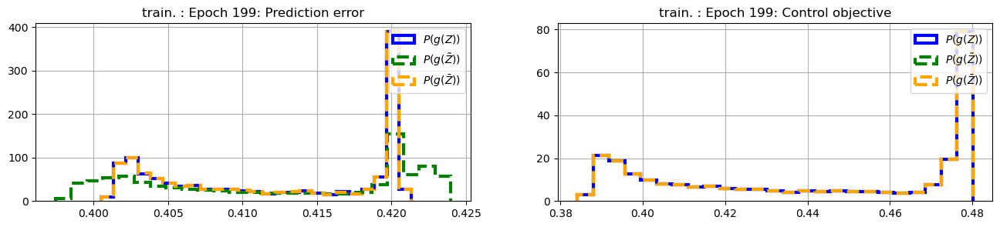

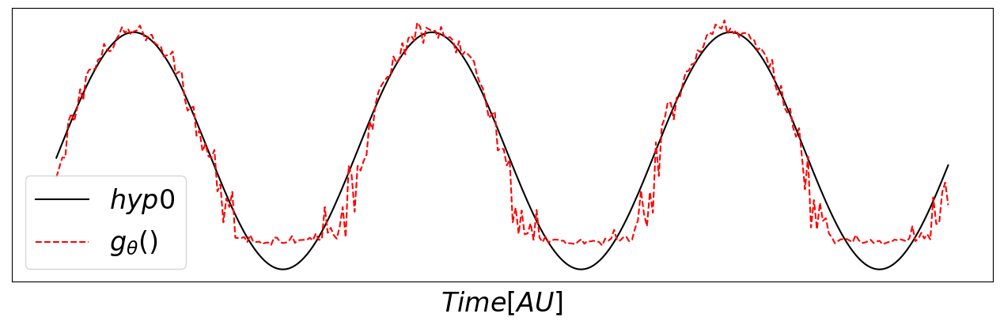

train. dtIRAS  Adam epoch 199: %Selected = 37, CR(zeta=1) = 0.859, CR = 1.0, predictionCorr (mean,std) = 0.954,0.003; ; Pred_error = 0.0919=-10.37 db; Val_error = -13.02 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.975, 0.001
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.975, 0.0


In [3]:
IRAS_train_script(observations_I_12_11.copy(), observations_tVec_I_12_11.copy(), V_I_12_11.copy(), nativeIRAS=False)

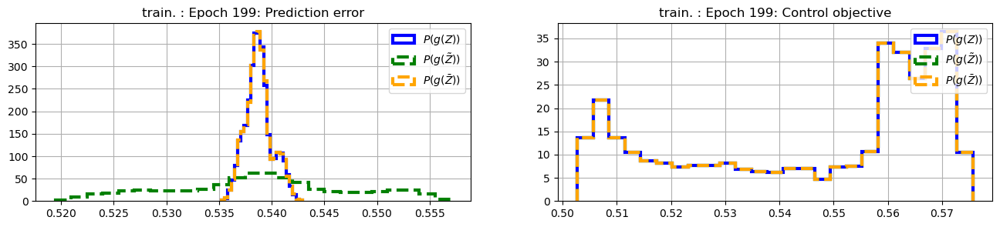

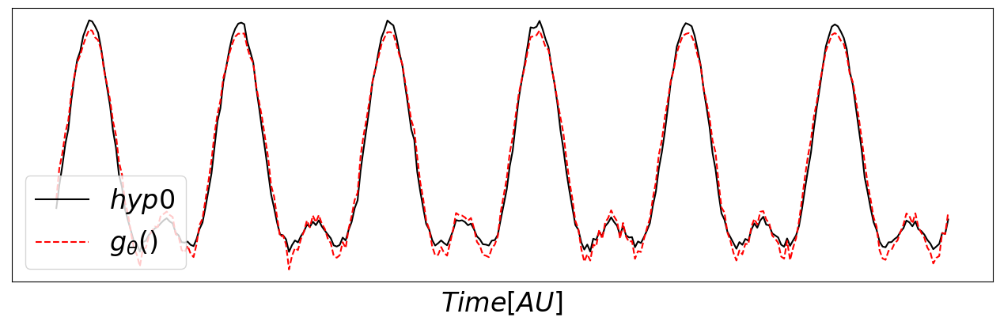

train. dtIRAS  Adam epoch 199: %Selected = 13, CR(zeta=1) = 0.155, CR = 0.996, predictionCorr (mean,std) = 0.976,0.001; ; Pred_error = 0.0479=-13.19 db; Val_error = -19.7 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.995, 0.0
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.995, 0.0


In [4]:
IRAS_train_script(observations_I_50_26.copy(), observations_tVec_I_12_11.copy(), V_I_50_26.copy(), nativeIRAS=False)

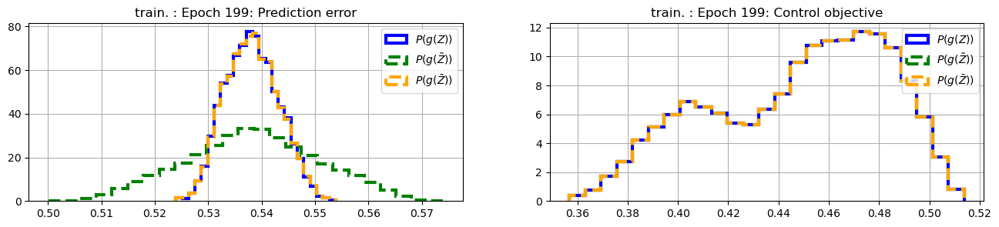

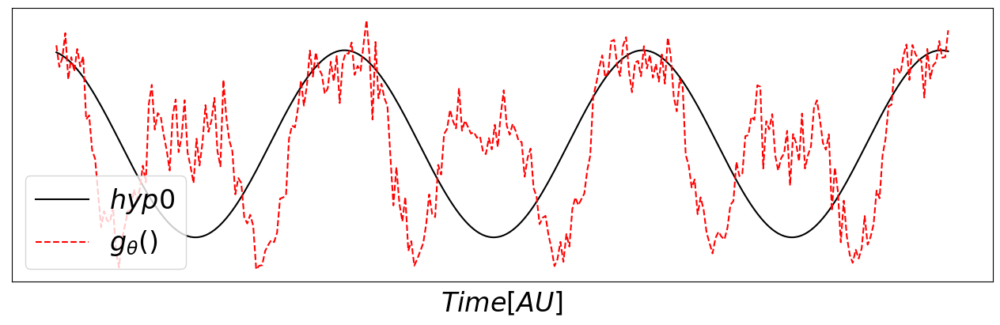

train. dtIRAS  Adam epoch 199: %Selected = 34, CR(zeta=1) = 0.403, CR = 0.999, predictionCorr (mean,std) = 0.836,0.006; ; Pred_error = 0.3275=-4.85 db; Val_error = 0.88 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.387, 0.019


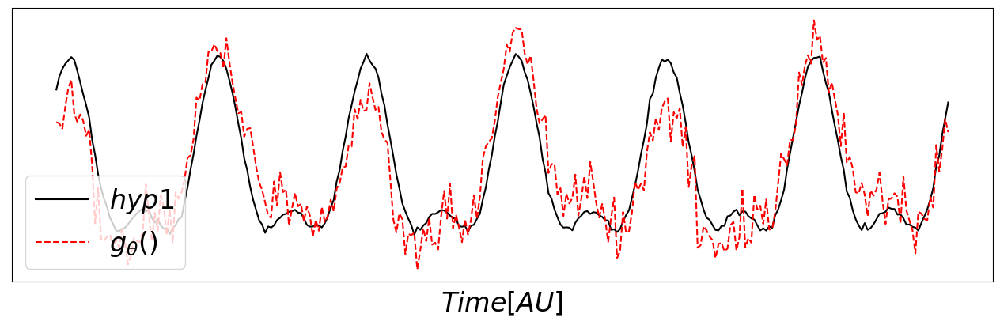

train. dtIRAS  Adam epoch 199: %Selected = 34, CR(zeta=1) = 0.403, CR = 0.999, predictionCorr (mean,std) = 0.836,0.006; ; Pred_error = 0.3275=-4.85 db; Val_error = -6.28 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.882, 0.009
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.882, 0.0


In [5]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

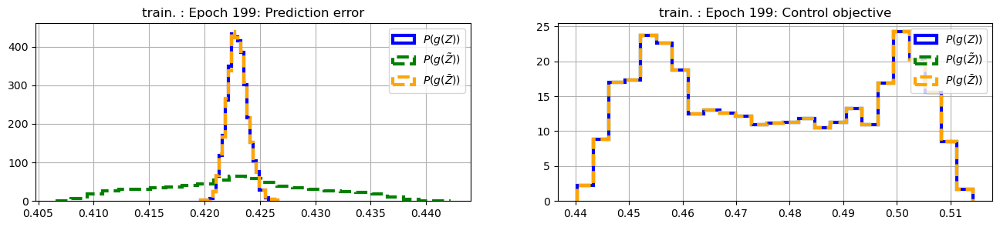

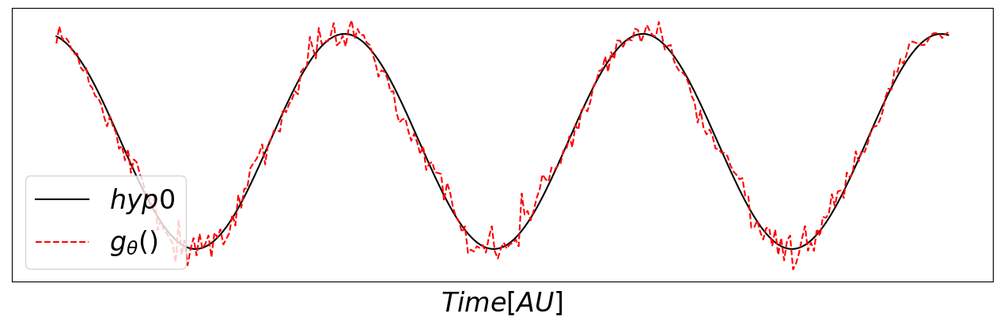

train. dtIRAS  Adam epoch 199: %Selected = 10, CR(zeta=1) = 0.131, CR = 1.002, predictionCorr (mean,std) = 0.983,0.002; ; Pred_error = 0.0341=-14.67 db; Val_error = -15.68 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.986, 0.004


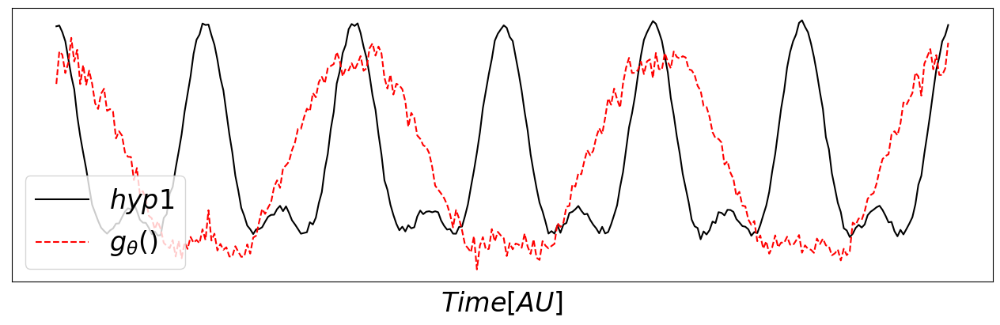

train. dtIRAS  Adam epoch 199: %Selected = 10, CR(zeta=1) = 0.131, CR = 1.002, predictionCorr (mean,std) = 0.983,0.002; ; Pred_error = 0.0341=-14.67 db; Val_error = 2.75 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.058, 0.034
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.058, 0.0


In [6]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

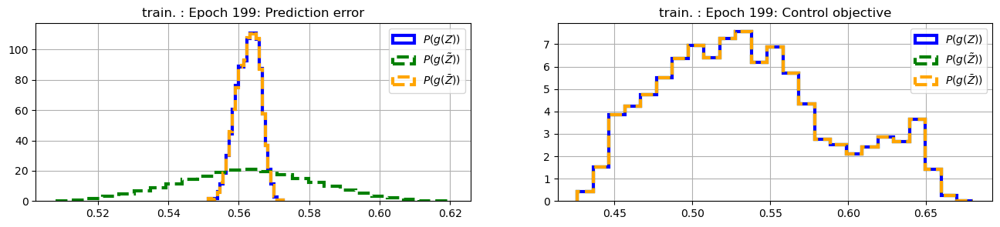

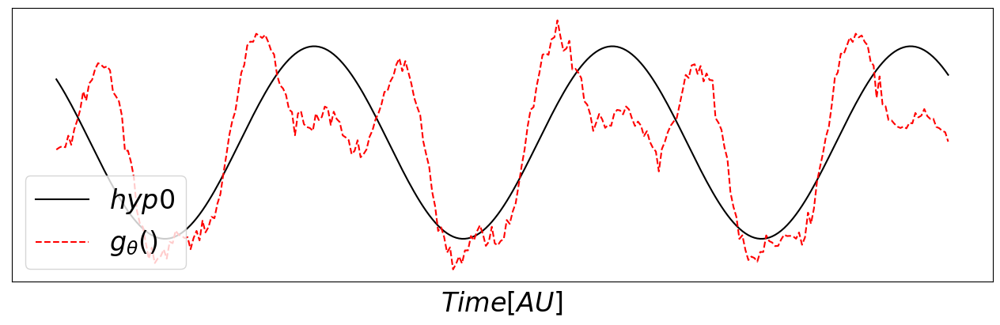

train. dtIRAS  Adam epoch 199: %Selected = 14, CR(zeta=1) = 0.176, CR = 0.999, predictionCorr (mean,std) = 0.969,0.004; ; Pred_error = 0.0624=-12.05 db; Val_error = -1.53 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.648, 0.01


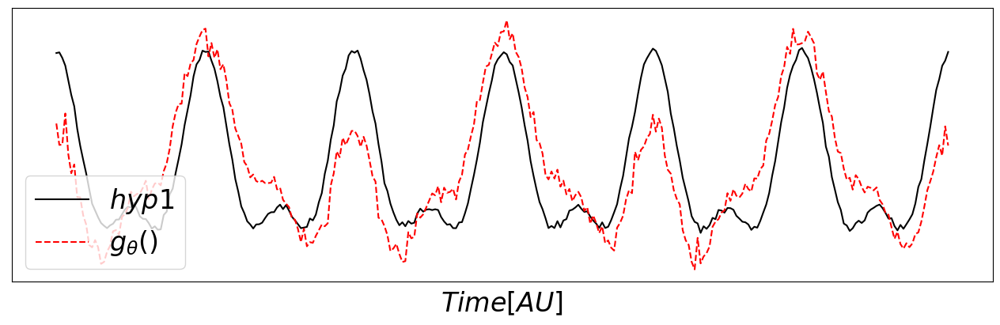

train. dtIRAS  Adam epoch 199: %Selected = 14, CR(zeta=1) = 0.176, CR = 0.999, predictionCorr (mean,std) = 0.969,0.004; ; Pred_error = 0.0624=-12.05 db; Val_error = -3.02 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.751, 0.008
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.751, 0.0


In [7]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

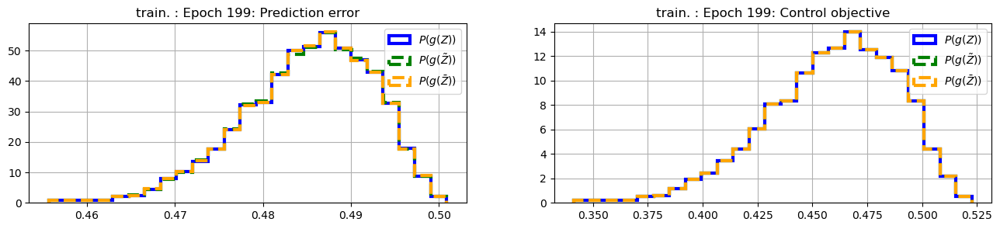

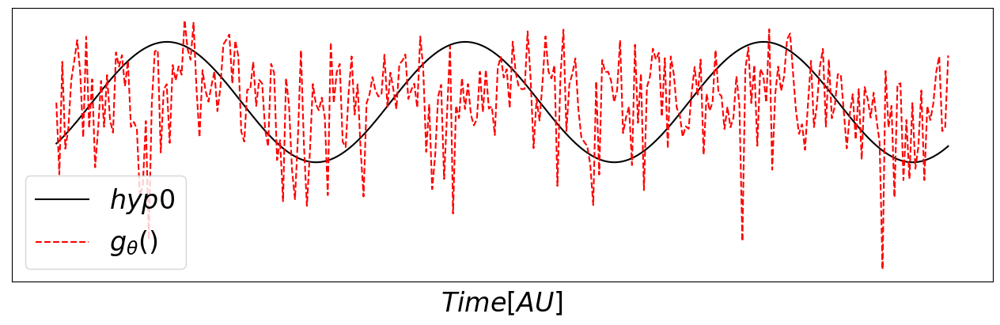

train. dtIRAS  Adam epoch 199: %Selected = 54, CR(zeta=1) = 1.001, CR = 1.0, predictionCorr (mean,std) = -0.054,0.059; ; Pred_error = 1.8731=2.73 db; Val_error = 2.71 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.06, 0.056


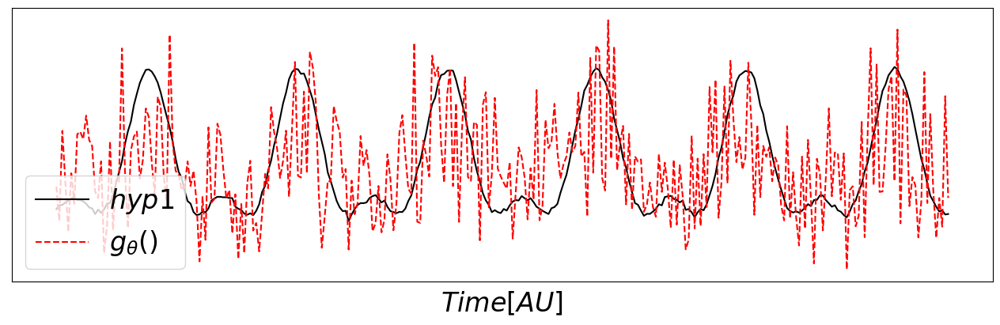

train. dtIRAS  Adam epoch 199: %Selected = 54, CR(zeta=1) = 1.001, CR = 1.0, predictionCorr (mean,std) = -0.054,0.059; ; Pred_error = 1.8731=2.73 db; Val_error = 1.55 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.284, 0.049
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.284, 0.0


In [8]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

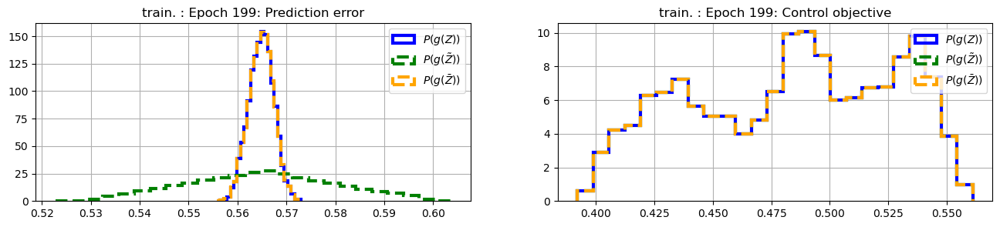

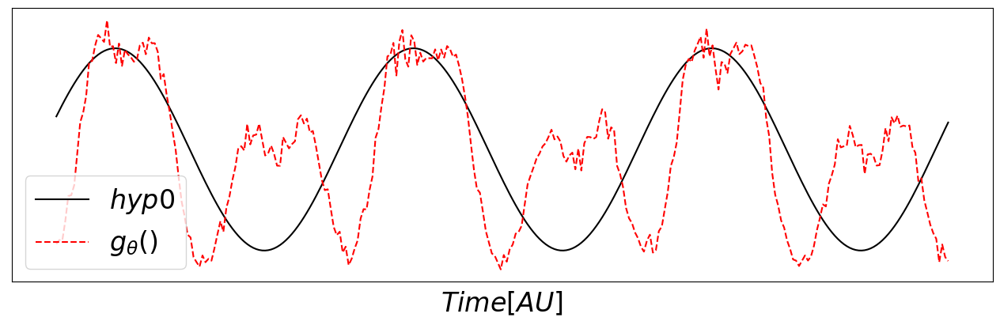

train. dtIRAS  Adam epoch 199: %Selected = 14, CR(zeta=1) = 0.17, CR = 0.995, predictionCorr (mean,std) = 0.971,0.002; ; Pred_error = 0.058=-12.37 db; Val_error = 0.57 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.429, 0.037


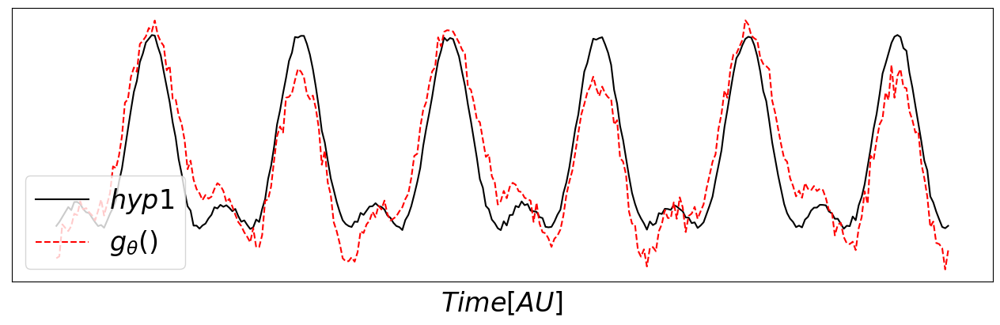

train. dtIRAS  Adam epoch 199: %Selected = 14, CR(zeta=1) = 0.17, CR = 0.995, predictionCorr (mean,std) = 0.971,0.002; ; Pred_error = 0.058=-12.37 db; Val_error = -6.51 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.888, 0.016
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.888, 0.0


In [9]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

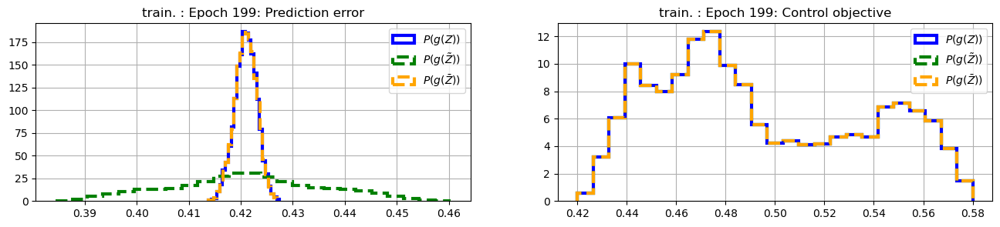

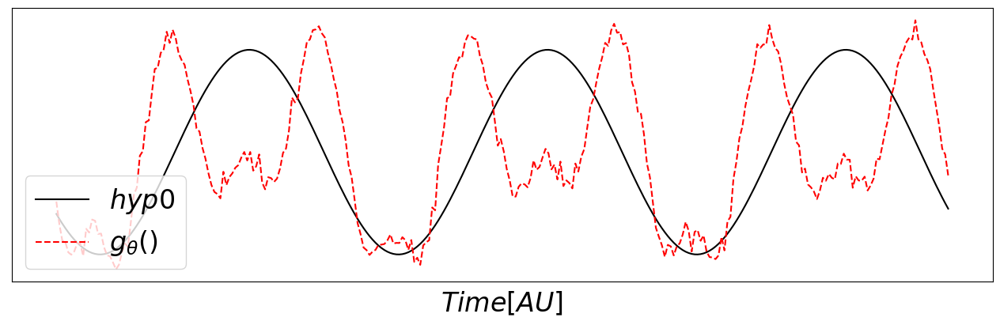

train. dtIRAS  Adam epoch 199: %Selected = 12, CR(zeta=1) = 0.147, CR = 0.997, predictionCorr (mean,std) = 0.979,0.001; ; Pred_error = 0.0428=-13.68 db; Val_error = 1.49 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.296, 0.036


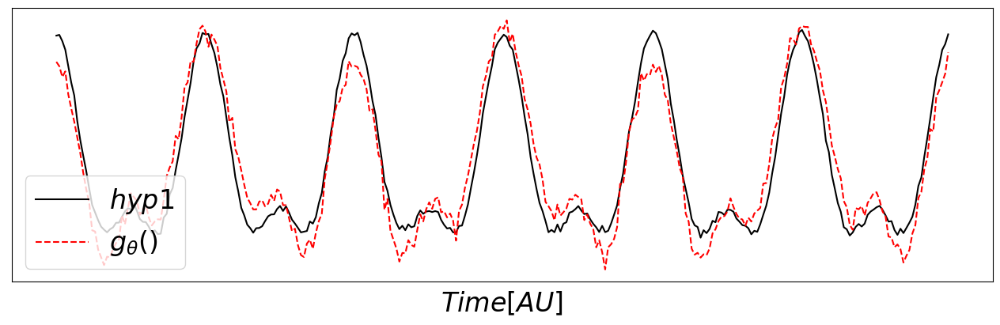

train. dtIRAS  Adam epoch 199: %Selected = 12, CR(zeta=1) = 0.147, CR = 0.997, predictionCorr (mean,std) = 0.979,0.001; ; Pred_error = 0.0428=-13.68 db; Val_error = -9.49 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.943, 0.011
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.943, 0.0


In [10]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

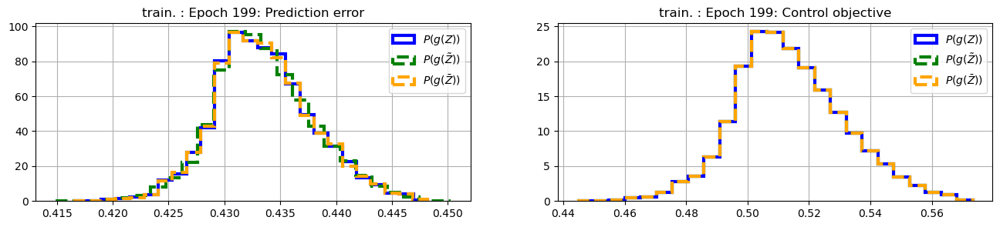

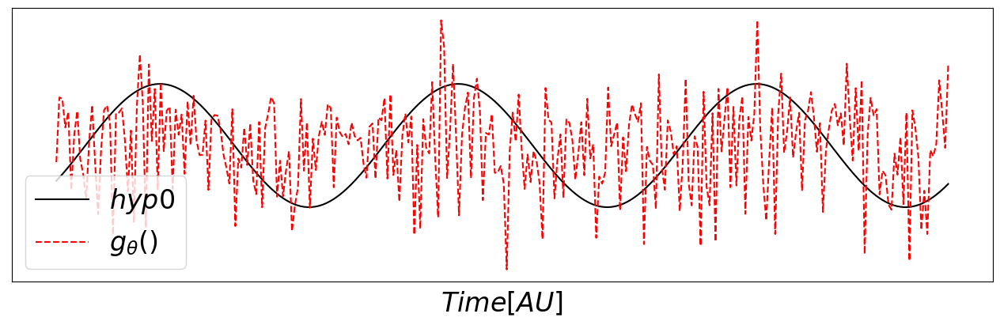

train. dtIRAS  Adam epoch 199: %Selected = 8, CR(zeta=1) = 0.996, CR = 0.999, predictionCorr (mean,std) = 0.024,0.038; ; Pred_error = 1.9239=2.84 db; Val_error = 2.8 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.011, 0.059


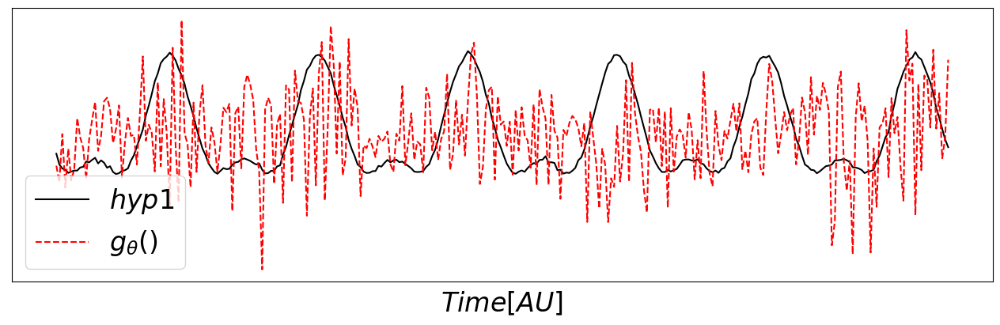

train. dtIRAS  Adam epoch 199: %Selected = 8, CR(zeta=1) = 0.996, CR = 0.999, predictionCorr (mean,std) = 0.024,0.038; ; Pred_error = 1.9239=2.84 db; Val_error = 2.76 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.044, 0.046
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.044, 0.0


In [11]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

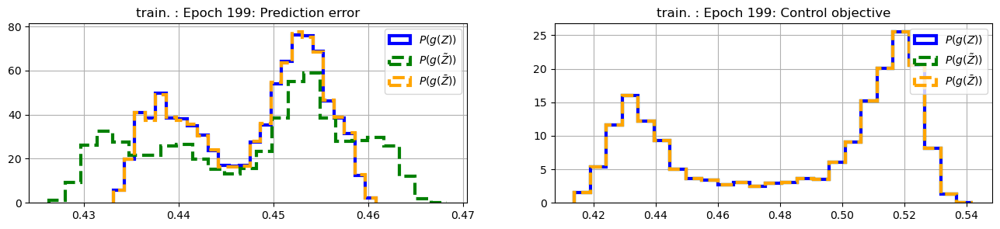

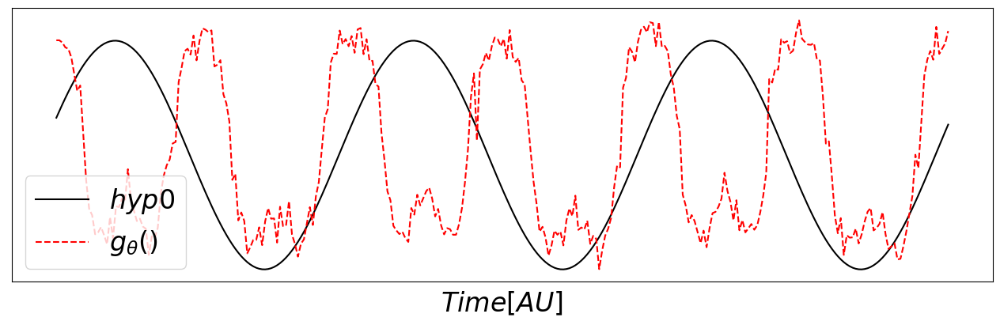

train. dtIRAS  Adam epoch 199: %Selected = 31, CR(zeta=1) = 0.713, CR = 0.999, predictionCorr (mean,std) = 0.71,0.011; ; Pred_error = 0.5789=-2.37 db; Val_error = 2.81 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.044, 0.009


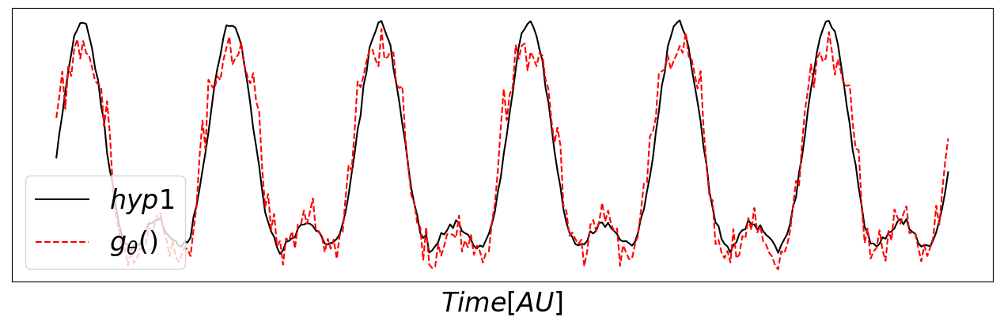

train. dtIRAS  Adam epoch 199: %Selected = 31, CR(zeta=1) = 0.713, CR = 0.999, predictionCorr (mean,std) = 0.71,0.011; ; Pred_error = 0.5789=-2.37 db; Val_error = -11.46 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.964, 0.004
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.964, 0.0


In [12]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

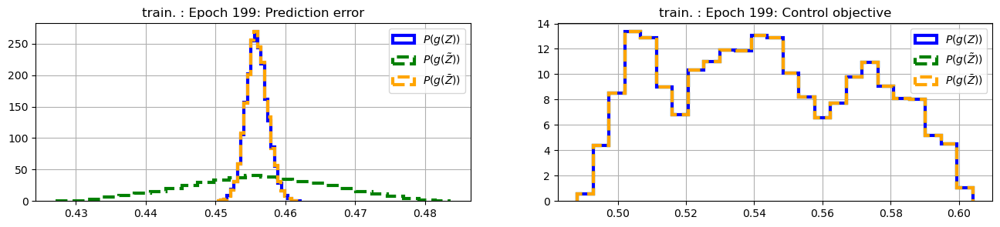

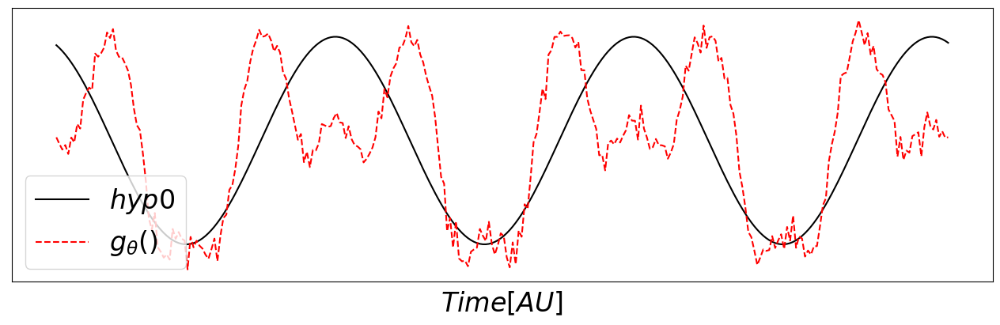

train. dtIRAS  Adam epoch 199: %Selected = 12, CR(zeta=1) = 0.154, CR = 1.001, predictionCorr (mean,std) = 0.976,0.002; ; Pred_error = 0.0471=-13.27 db; Val_error = 0.07 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.491, 0.04


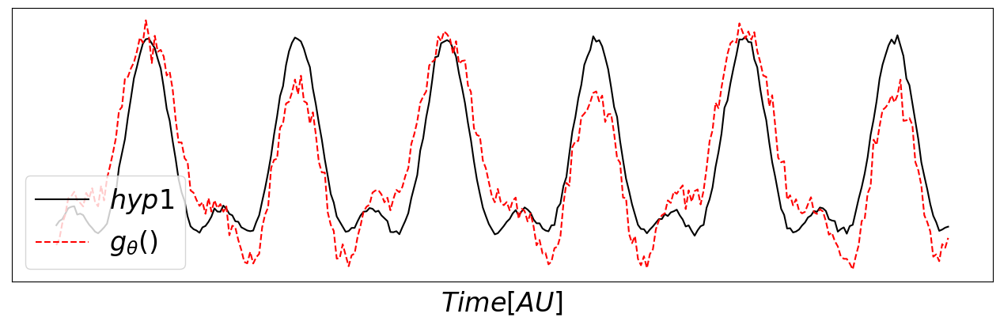

train. dtIRAS  Adam epoch 199: %Selected = 12, CR(zeta=1) = 0.154, CR = 1.001, predictionCorr (mean,std) = 0.976,0.002; ; Pred_error = 0.0471=-13.27 db; Val_error = -5.3 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.852, 0.02
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.852, 0.0


In [13]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

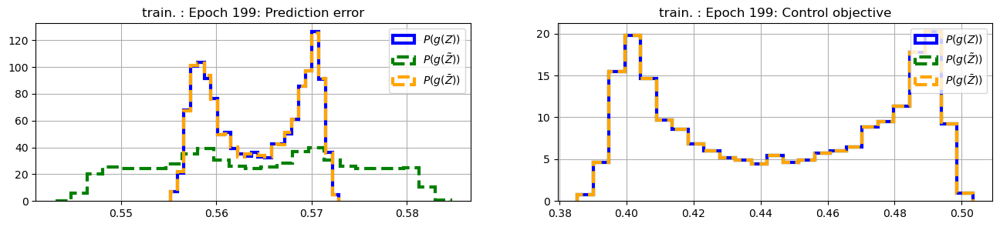

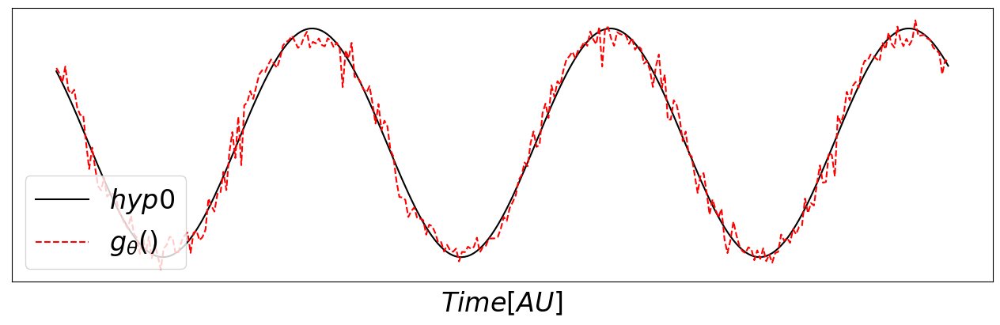

train. dtIRAS  Adam epoch 199: %Selected = 25, CR(zeta=1) = 0.516, CR = 0.999, predictionCorr (mean,std) = 0.919,0.003; ; Pred_error = 0.1612=-7.93 db; Val_error = -16.9 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.99, 0.001


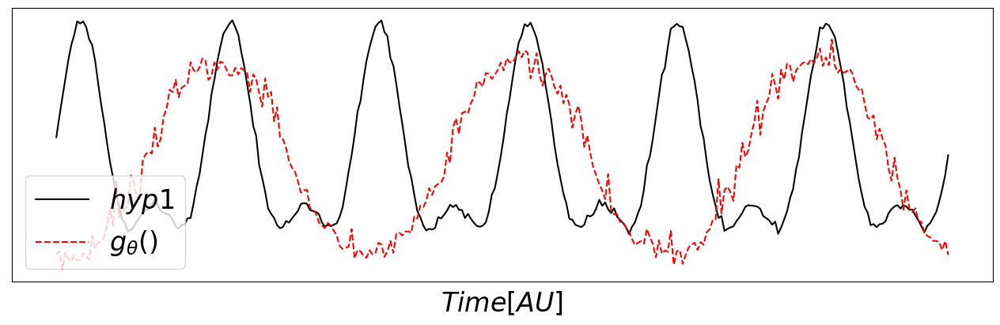

train. dtIRAS  Adam epoch 199: %Selected = 25, CR(zeta=1) = 0.516, CR = 0.999, predictionCorr (mean,std) = 0.919,0.003; ; Pred_error = 0.1612=-7.93 db; Val_error = 2.98 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.002, 0.008
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.002, 0.0


In [14]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

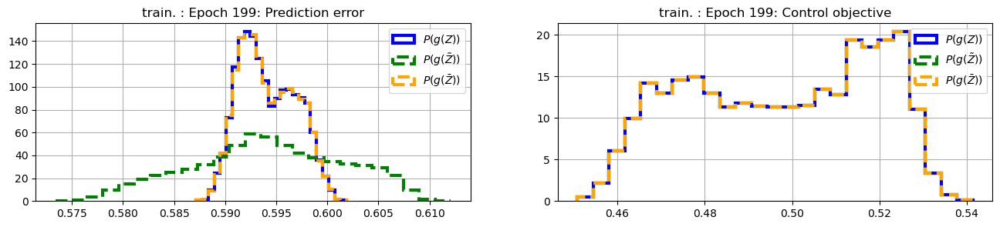

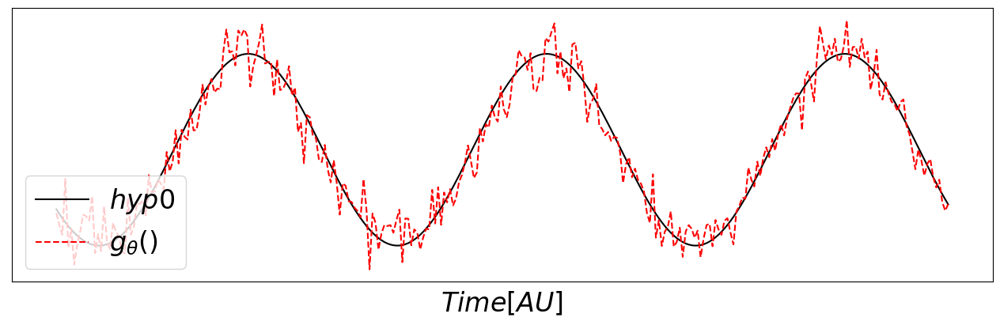

train. dtIRAS  Adam epoch 199: %Selected = 27, CR(zeta=1) = 0.375, CR = 0.999, predictionCorr (mean,std) = 0.859,0.005; ; Pred_error = 0.2825=-5.49 db; Val_error = -11.48 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.964, 0.003


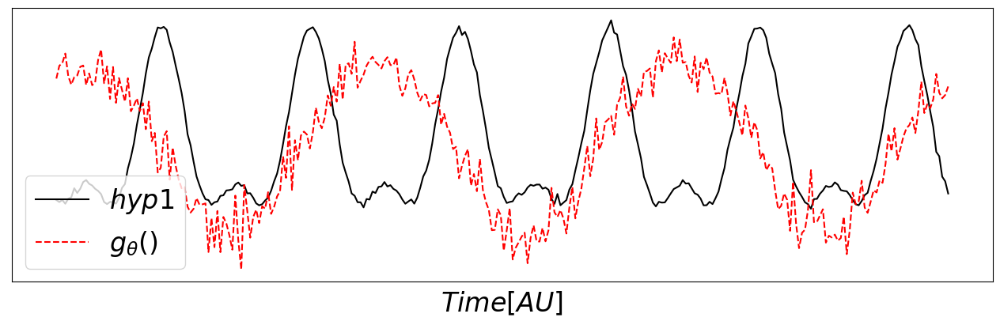

train. dtIRAS  Adam epoch 199: %Selected = 27, CR(zeta=1) = 0.375, CR = 0.999, predictionCorr (mean,std) = 0.859,0.005; ; Pred_error = 0.2825=-5.49 db; Val_error = 2.83 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.002, 0.042
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.002, 0.0


In [15]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

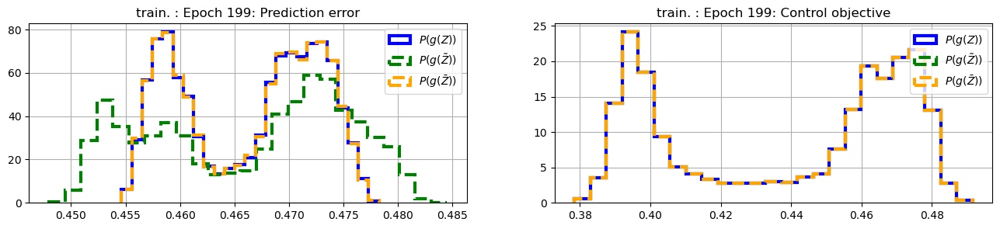

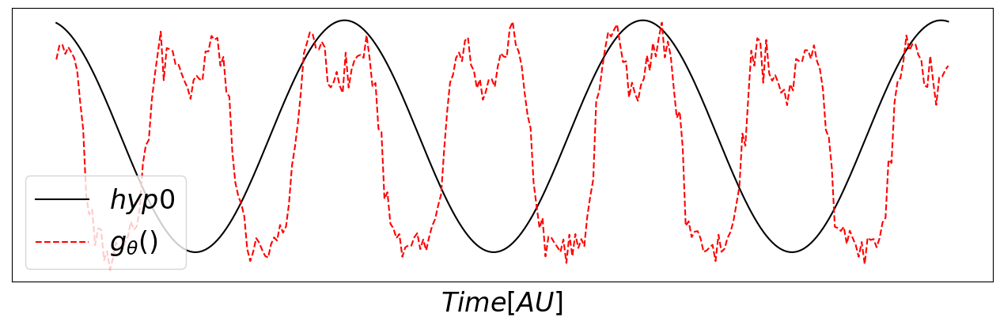

train. dtIRAS  Adam epoch 199: %Selected = 32, CR(zeta=1) = 0.717, CR = 0.999, predictionCorr (mean,std) = 0.792,0.008; ; Pred_error = 0.4167=-3.8 db; Val_error = 2.99 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.003, 0.006


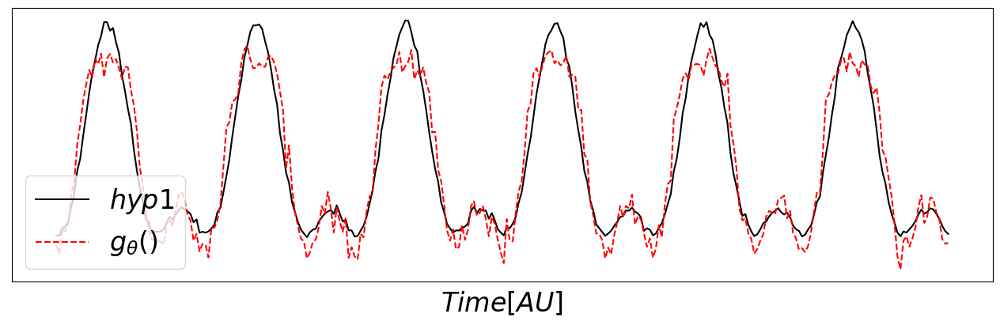

train. dtIRAS  Adam epoch 199: %Selected = 32, CR(zeta=1) = 0.717, CR = 0.999, predictionCorr (mean,std) = 0.792,0.008; ; Pred_error = 0.4167=-3.8 db; Val_error = -10.3 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.953, 0.002
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.953, 0.0


In [16]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

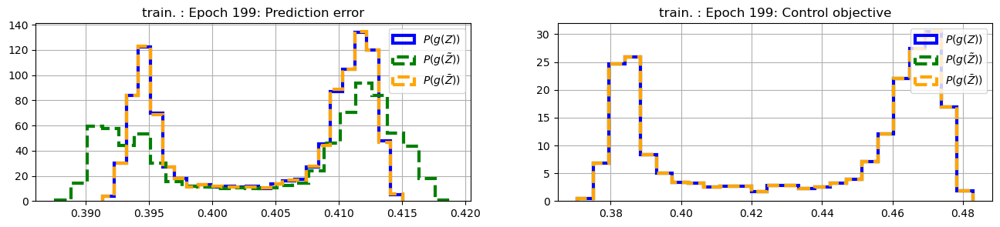

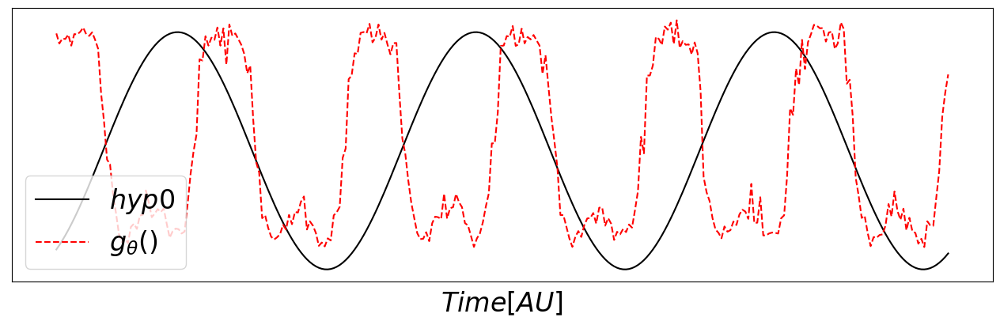

train. dtIRAS  Adam epoch 199: %Selected = 34, CR(zeta=1) = 0.838, CR = 1.0, predictionCorr (mean,std) = 0.882,0.004; ; Pred_error = 0.235=-6.29 db; Val_error = 2.96 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.01, 0.008


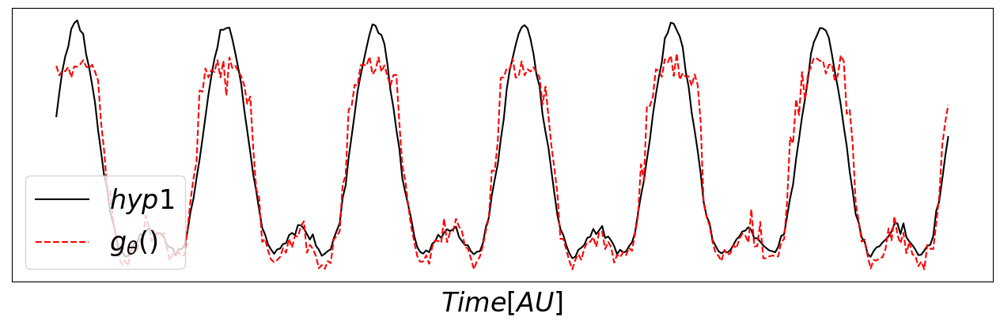

train. dtIRAS  Adam epoch 199: %Selected = 34, CR(zeta=1) = 0.838, CR = 1.0, predictionCorr (mean,std) = 0.882,0.004; ; Pred_error = 0.235=-6.29 db; Val_error = -10.42 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.955, 0.003
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.955, 0.0


In [17]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

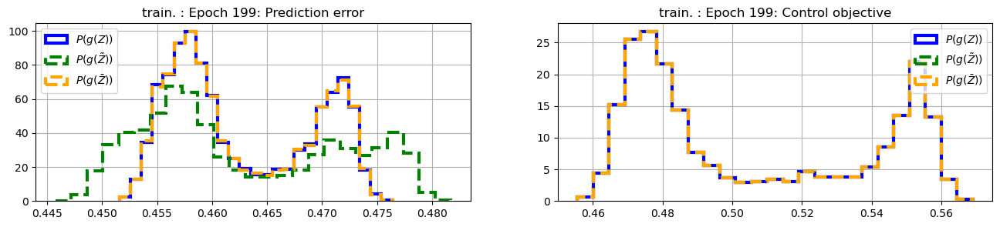

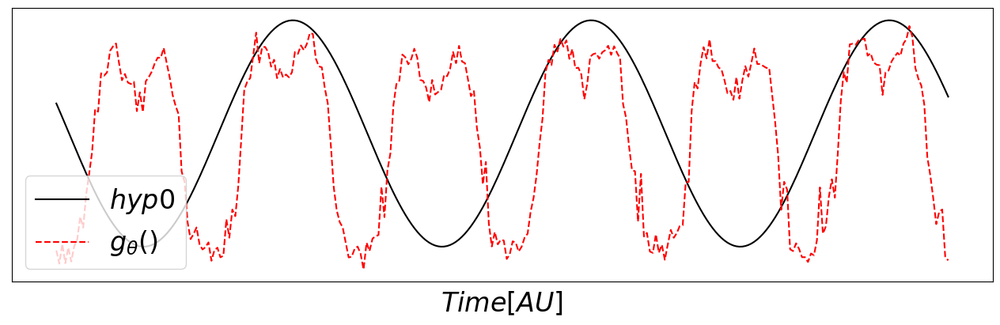

train. dtIRAS  Adam epoch 199: %Selected = 35, CR(zeta=1) = 0.73, CR = 1.0, predictionCorr (mean,std) = 0.807,0.008; ; Pred_error = 0.3854=-4.14 db; Val_error = 2.8 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.048, 0.015


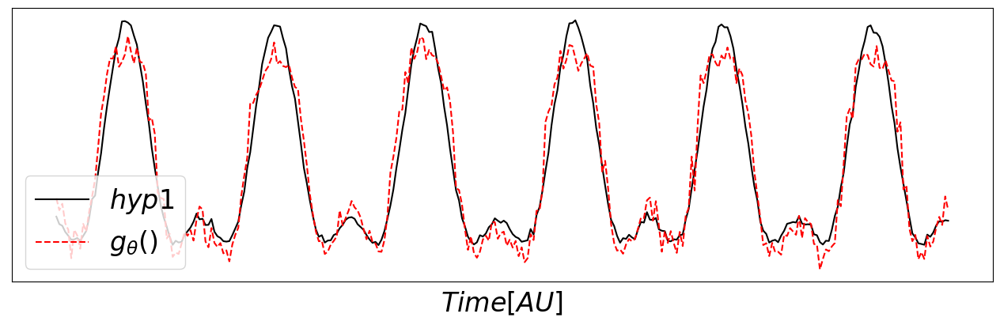

train. dtIRAS  Adam epoch 199: %Selected = 35, CR(zeta=1) = 0.73, CR = 1.0, predictionCorr (mean,std) = 0.807,0.008; ; Pred_error = 0.3854=-4.14 db; Val_error = -11.91 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.968, 0.002
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.968, 0.0


In [18]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

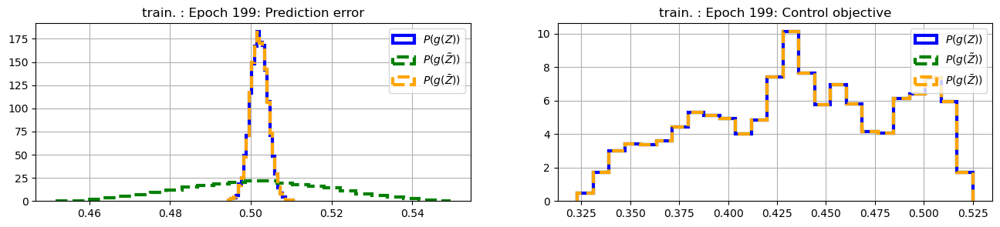

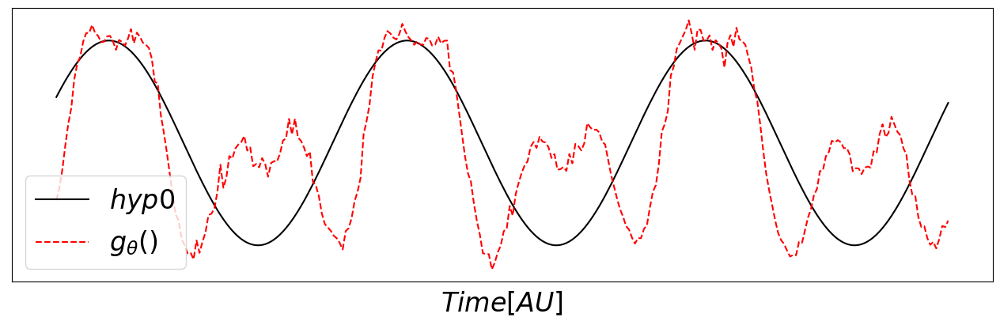

train. dtIRAS  Adam epoch 199: %Selected = 10, CR(zeta=1) = 0.123, CR = 0.995, predictionCorr (mean,std) = 0.985,0.002; ; Pred_error = 0.0301=-15.21 db; Val_error = -0.44 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.548, 0.022


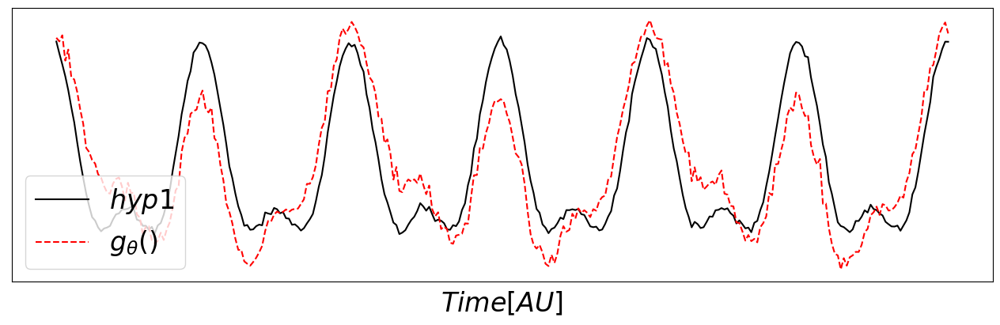

train. dtIRAS  Adam epoch 199: %Selected = 10, CR(zeta=1) = 0.123, CR = 0.995, predictionCorr (mean,std) = 0.985,0.002; ; Pred_error = 0.0301=-15.21 db; Val_error = -4.64 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.828, 0.013
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.828, 0.0


In [19]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

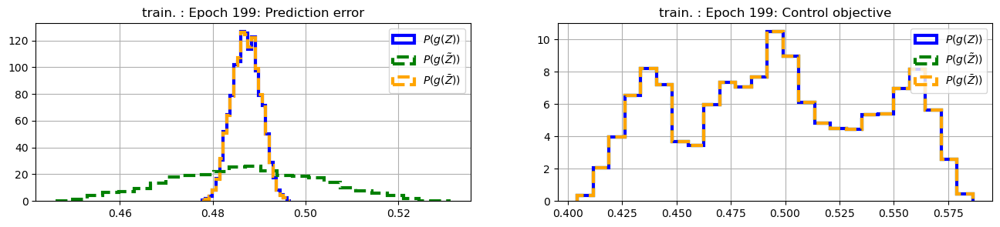

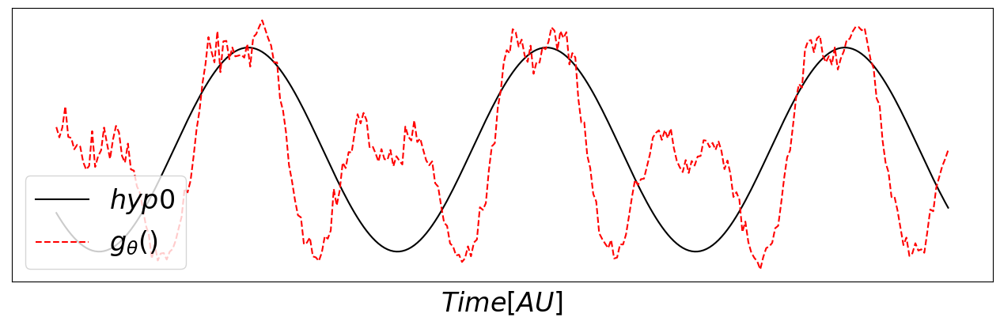

train. dtIRAS  Adam epoch 199: %Selected = 16, CR(zeta=1) = 0.193, CR = 1.0, predictionCorr (mean,std) = 0.964,0.003; ; Pred_error = 0.0727=-11.38 db; Val_error = 0.55 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.431, 0.059


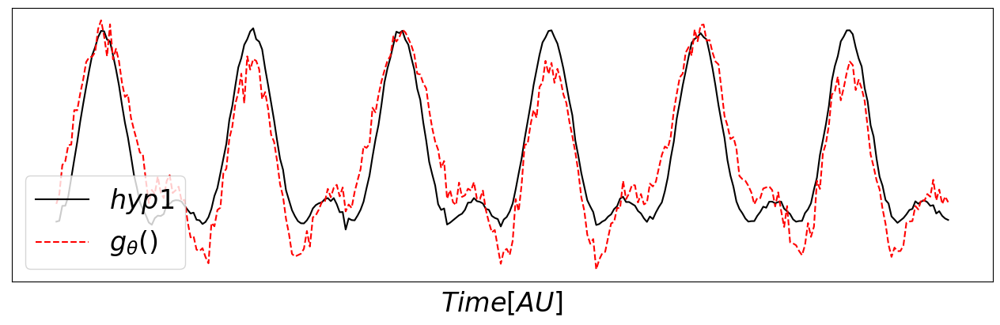

train. dtIRAS  Adam epoch 199: %Selected = 16, CR(zeta=1) = 0.193, CR = 1.0, predictionCorr (mean,std) = 0.964,0.003; ; Pred_error = 0.0727=-11.38 db; Val_error = -6.16 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.878, 0.024
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.878, 0.0


In [20]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

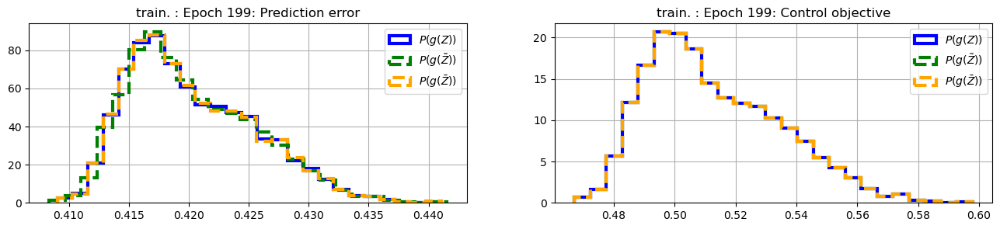

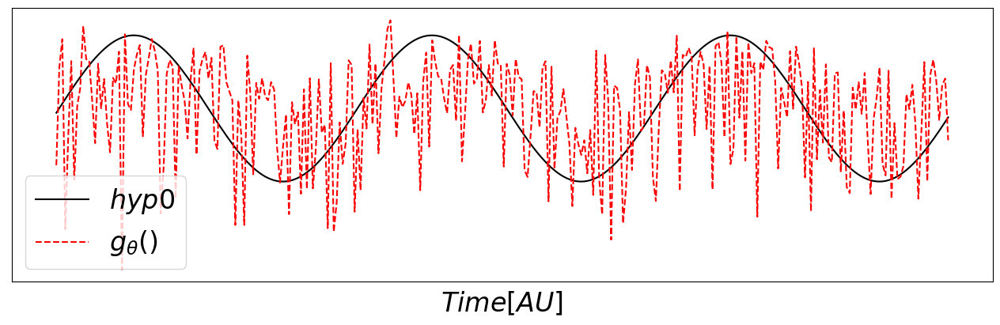

train. dtIRAS  Adam epoch 199: %Selected = 11, CR(zeta=1) = 0.994, CR = 1.0, predictionCorr (mean,std) = 0.126,0.057; ; Pred_error = 1.7465=2.42 db; Val_error = 1.53 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.289, 0.028


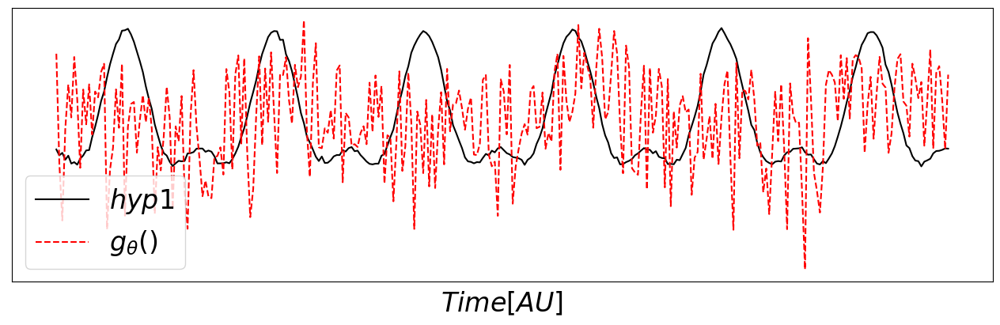

train. dtIRAS  Adam epoch 199: %Selected = 11, CR(zeta=1) = 0.994, CR = 1.0, predictionCorr (mean,std) = 0.126,0.057; ; Pred_error = 1.7465=2.42 db; Val_error = 2.8 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.031, 0.053
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.031, 0.0


In [21]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

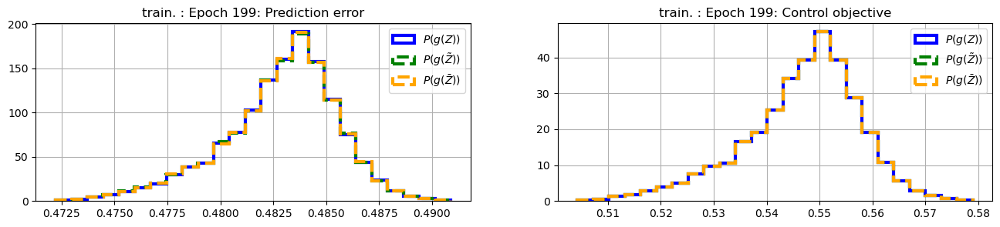

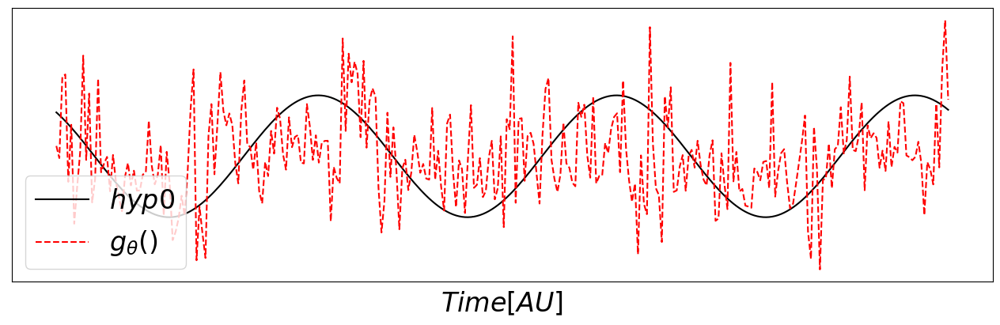

train. dtIRAS  Adam epoch 199: %Selected = 33, CR(zeta=1) = 0.993, CR = 1.002, predictionCorr (mean,std) = 0.007,0.054; ; Pred_error = 1.9044=2.8 db; Val_error = 2.51 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.107, 0.057


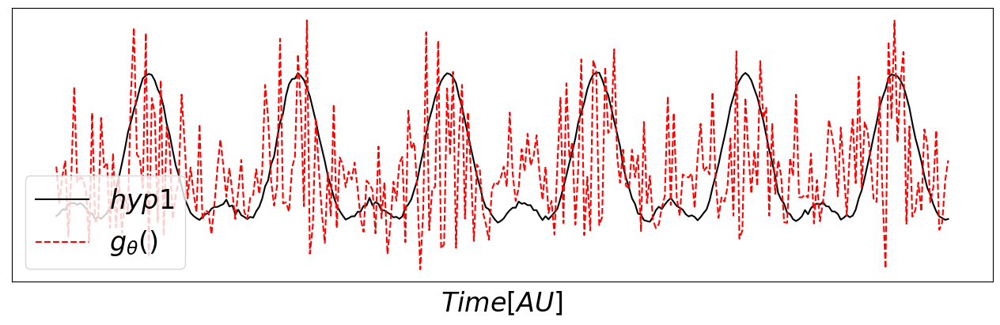

train. dtIRAS  Adam epoch 199: %Selected = 33, CR(zeta=1) = 0.993, CR = 1.002, predictionCorr (mean,std) = 0.007,0.054; ; Pred_error = 1.9044=2.8 db; Val_error = 2.54 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.098, 0.069
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.098, 0.0


In [22]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

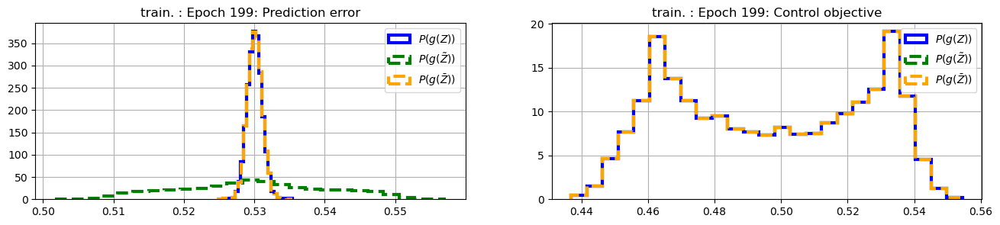

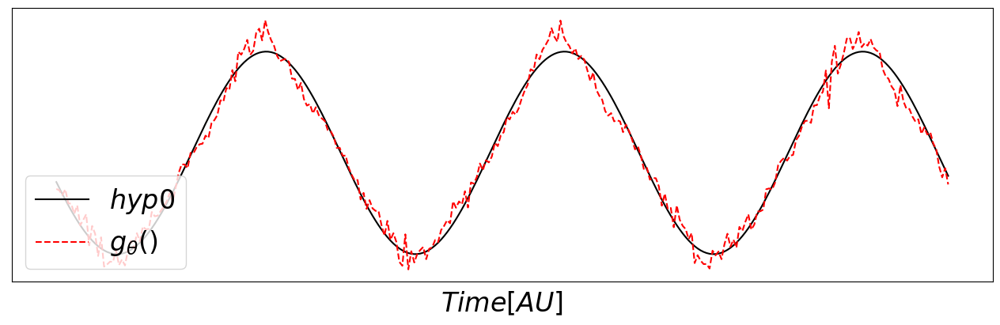

train. dtIRAS  Adam epoch 199: %Selected = 9, CR(zeta=1) = 0.105, CR = 0.999, predictionCorr (mean,std) = 0.989,0.001; ; Pred_error = 0.0219=-16.6 db; Val_error = -15.59 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.986, 0.001


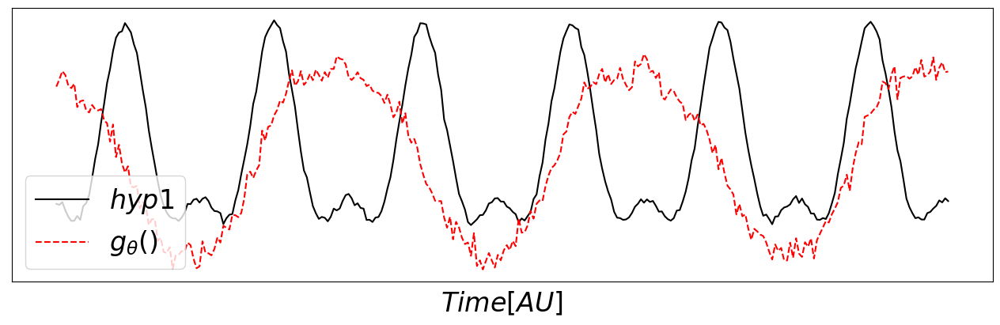

train. dtIRAS  Adam epoch 199: %Selected = 9, CR(zeta=1) = 0.105, CR = 0.999, predictionCorr (mean,std) = 0.989,0.001; ; Pred_error = 0.0219=-16.6 db; Val_error = 2.63 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.083, 0.025
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.083, 0.0


In [23]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

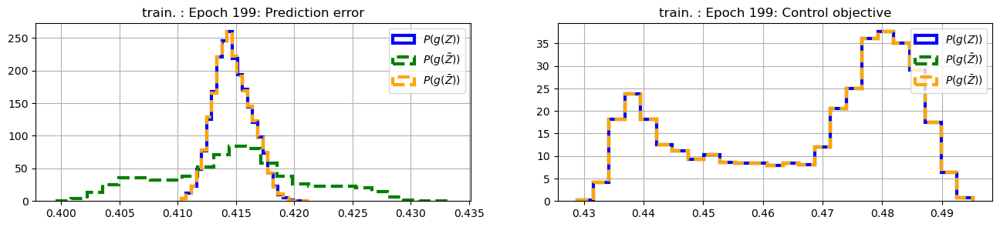

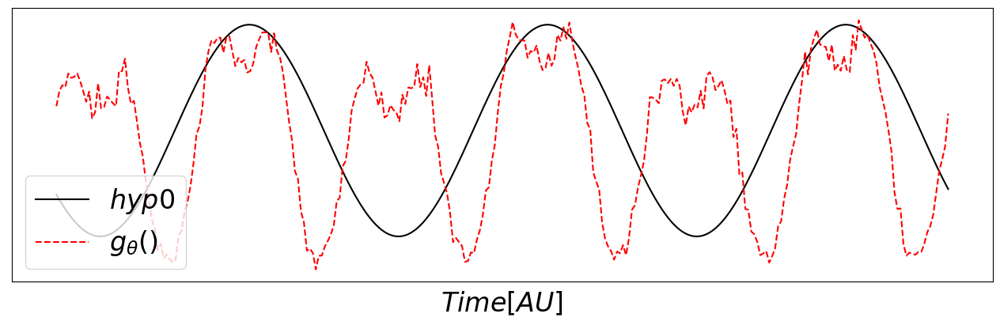

train. dtIRAS  Adam epoch 199: %Selected = 24, CR(zeta=1) = 0.265, CR = 0.999, predictionCorr (mean,std) = 0.93,0.004; ; Pred_error = 0.14=-8.54 db; Val_error = 2.24 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.162, 0.036


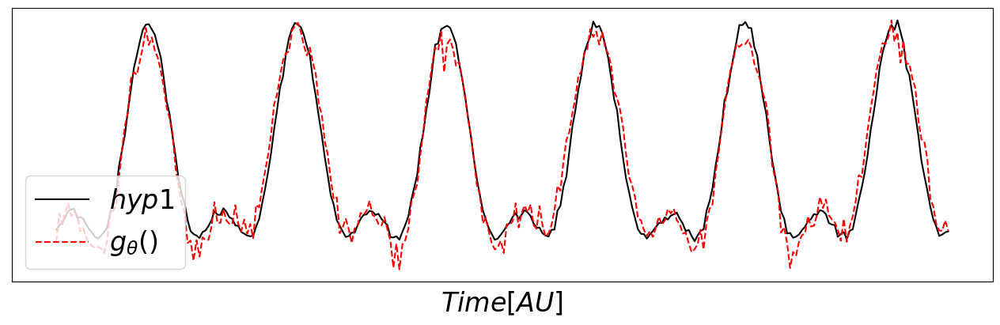

train. dtIRAS  Adam epoch 199: %Selected = 24, CR(zeta=1) = 0.265, CR = 0.999, predictionCorr (mean,std) = 0.93,0.004; ; Pred_error = 0.14=-8.54 db; Val_error = -13.39 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.977, 0.005
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.977, 0.0


In [24]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

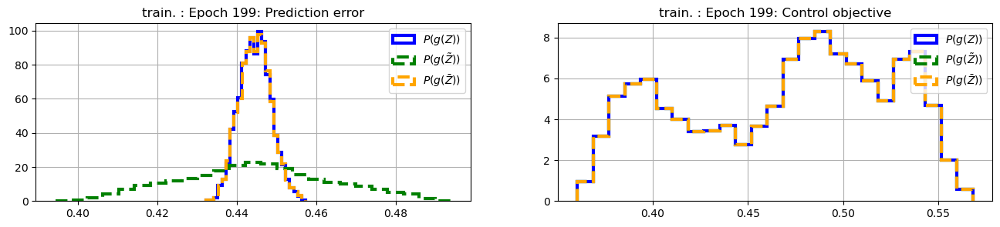

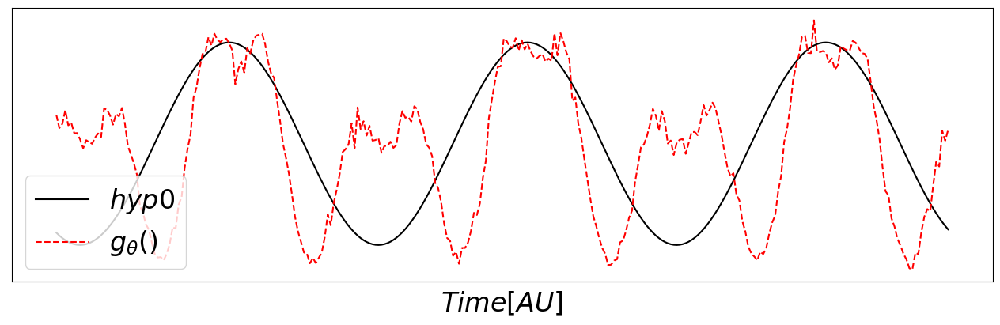

train. dtIRAS  Adam epoch 199: %Selected = 18, CR(zeta=1) = 0.21, CR = 0.999, predictionCorr (mean,std) = 0.956,0.002; ; Pred_error = 0.0875=-10.58 db; Val_error = 1.23 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.336, 0.054


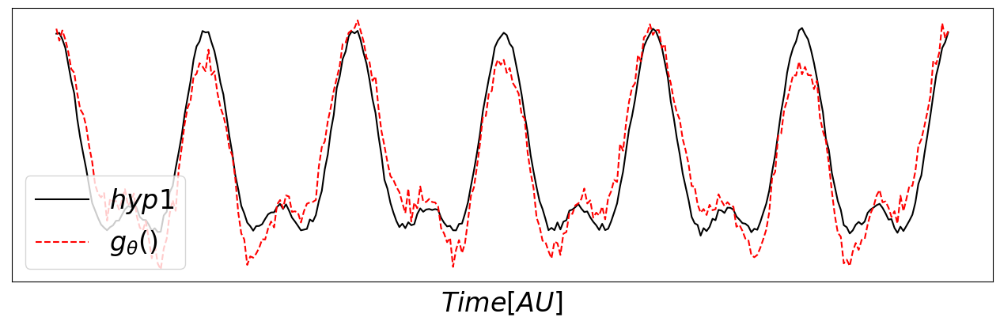

train. dtIRAS  Adam epoch 199: %Selected = 18, CR(zeta=1) = 0.21, CR = 0.999, predictionCorr (mean,std) = 0.956,0.002; ; Pred_error = 0.0875=-10.58 db; Val_error = -8.46 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.928, 0.018
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.928, 0.0


In [25]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

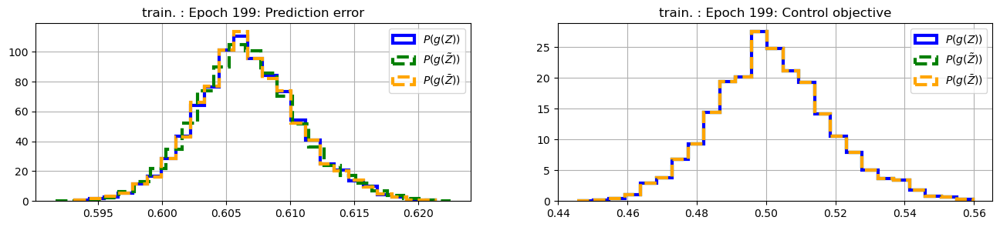

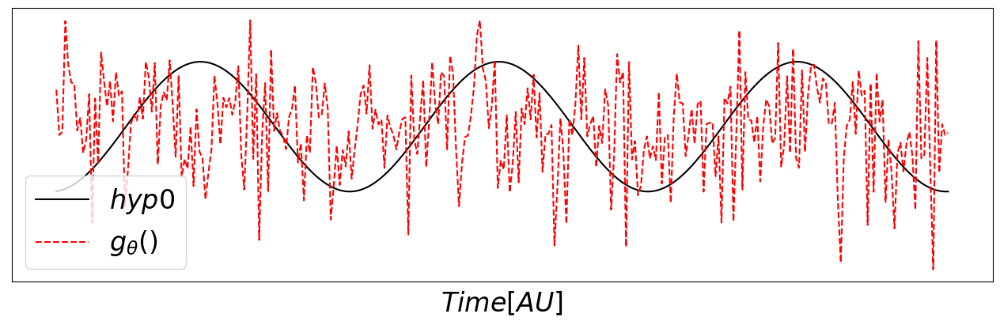

train. dtIRAS  Adam epoch 199: %Selected = 9, CR(zeta=1) = 0.994, CR = 0.994, predictionCorr (mean,std) = 0.021,0.058; ; Pred_error = 1.8984=2.78 db; Val_error = 2.81 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.007, 0.055


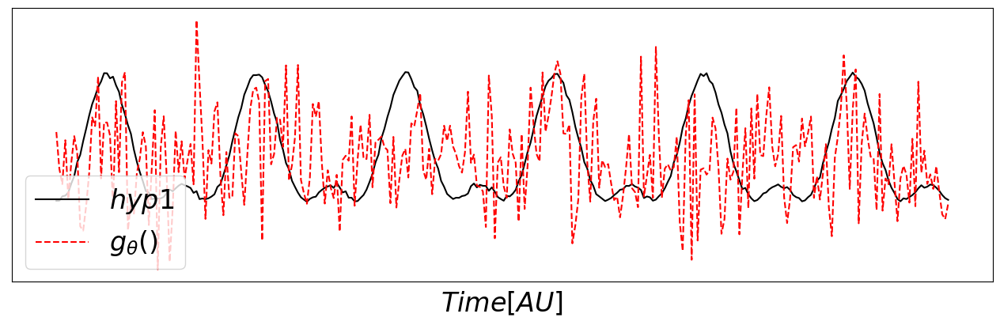

train. dtIRAS  Adam epoch 199: %Selected = 9, CR(zeta=1) = 0.994, CR = 0.994, predictionCorr (mean,std) = 0.021,0.058; ; Pred_error = 1.8984=2.78 db; Val_error = 2.76 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.04, 0.065
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.04, 0.0


In [26]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

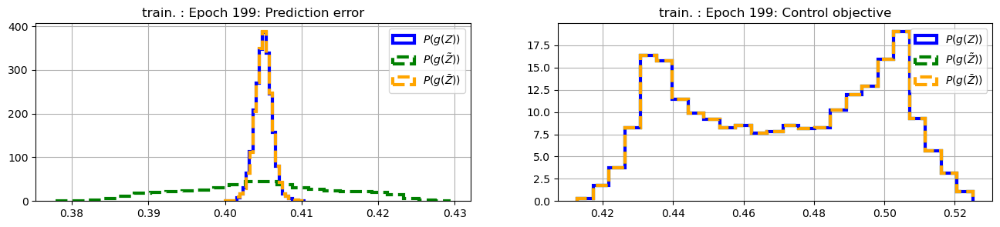

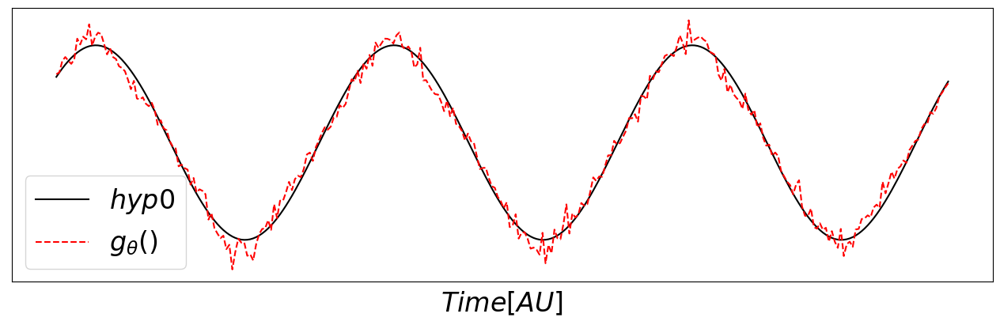

train. dtIRAS  Adam epoch 199: %Selected = 10, CR(zeta=1) = 0.116, CR = 0.999, predictionCorr (mean,std) = 0.987,0.002; ; Pred_error = 0.0264=-15.78 db; Val_error = -16.88 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.99, 0.001


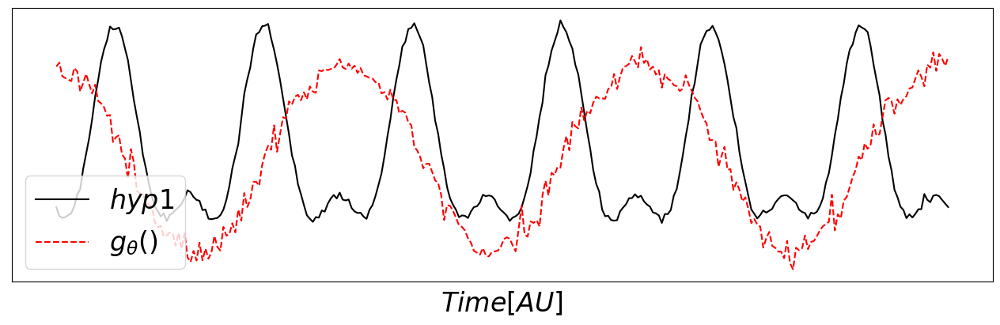

train. dtIRAS  Adam epoch 199: %Selected = 10, CR(zeta=1) = 0.116, CR = 0.999, predictionCorr (mean,std) = 0.987,0.002; ; Pred_error = 0.0264=-15.78 db; Val_error = 2.86 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.03, 0.028
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.03, 0.0


In [27]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

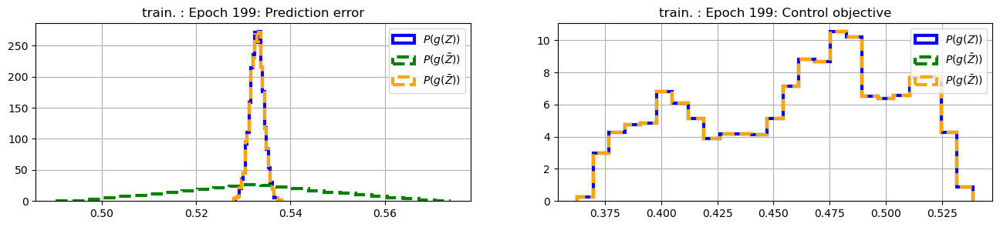

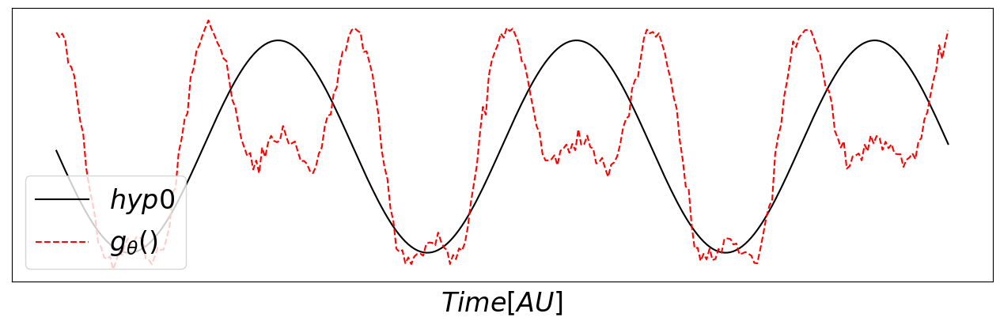

train. dtIRAS  Adam epoch 199: %Selected = 9, CR(zeta=1) = 0.095, CR = 1.002, predictionCorr (mean,std) = 0.991,0.001; ; Pred_error = 0.0179=-17.48 db; Val_error = 0.79 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.399, 0.051


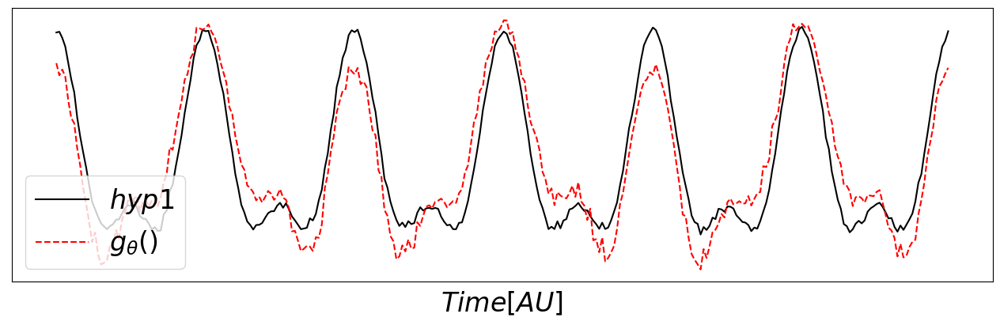

train. dtIRAS  Adam epoch 199: %Selected = 9, CR(zeta=1) = 0.095, CR = 1.002, predictionCorr (mean,std) = 0.991,0.001; ; Pred_error = 0.0179=-17.48 db; Val_error = -7.21 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.904, 0.021
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.904, 0.0


In [28]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

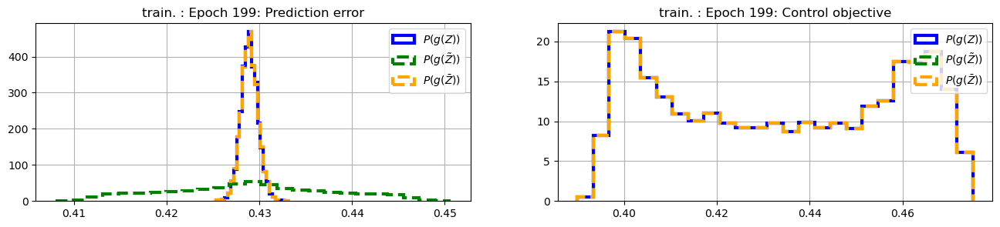

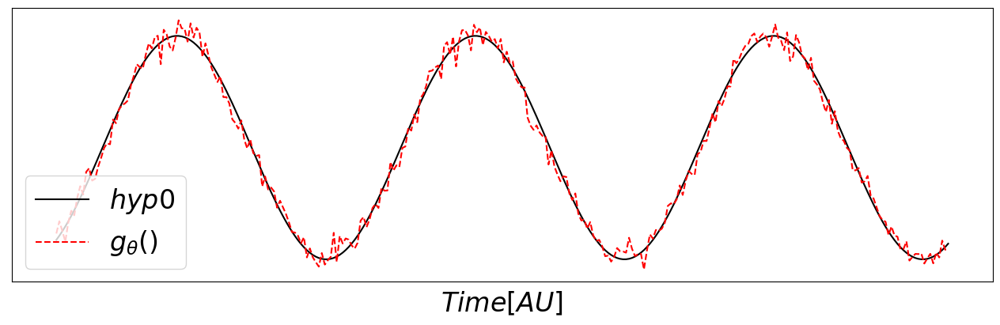

train. dtIRAS  Adam epoch 199: %Selected = 9, CR(zeta=1) = 0.106, CR = 1.002, predictionCorr (mean,std) = 0.989,0.001; ; Pred_error = 0.0224=-16.49 db; Val_error = -18.29 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.993, 0.001


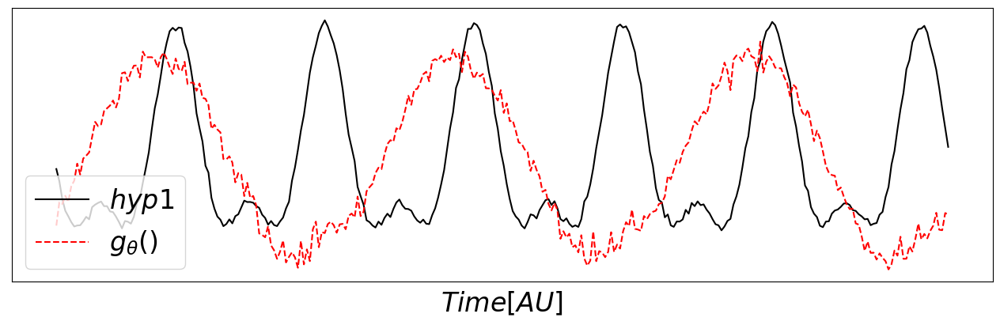

train. dtIRAS  Adam epoch 199: %Selected = 9, CR(zeta=1) = 0.106, CR = 1.002, predictionCorr (mean,std) = 0.989,0.001; ; Pred_error = 0.0224=-16.49 db; Val_error = 2.79 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.049, 0.008
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.049, 0.0


In [29]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

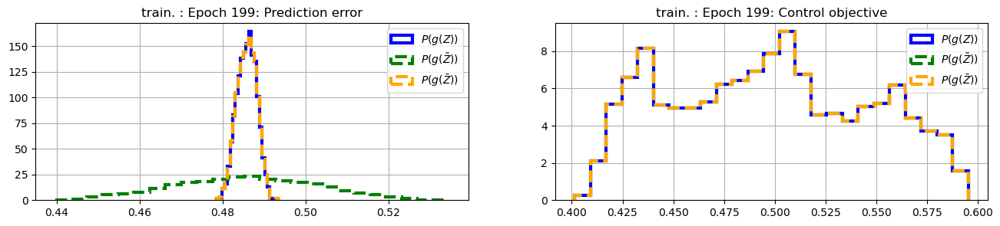

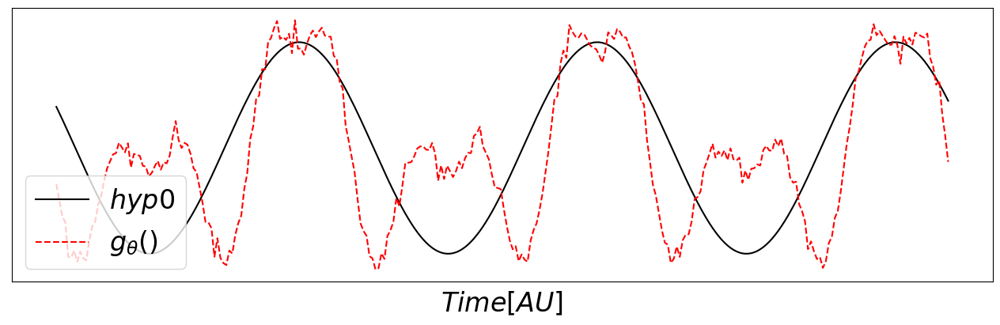

train. dtIRAS  Adam epoch 199: %Selected = 11, CR(zeta=1) = 0.138, CR = 0.999, predictionCorr (mean,std) = 0.981,0.001; ; Pred_error = 0.0377=-14.23 db; Val_error = -0.11 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.511, 0.052


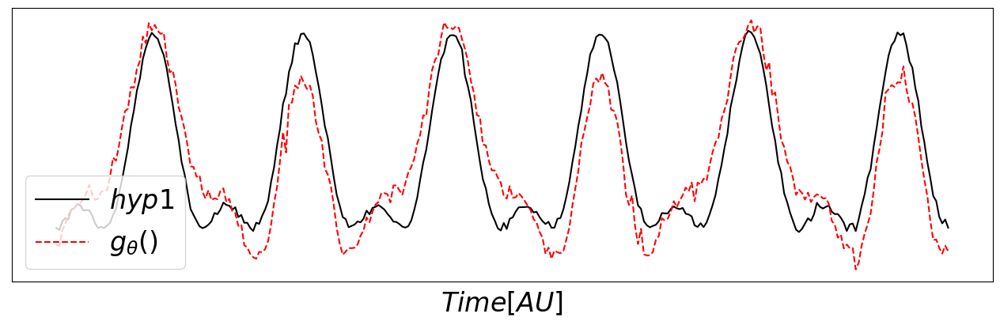

train. dtIRAS  Adam epoch 199: %Selected = 11, CR(zeta=1) = 0.138, CR = 0.999, predictionCorr (mean,std) = 0.981,0.001; ; Pred_error = 0.0377=-14.23 db; Val_error = -5.09 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.844, 0.028
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.844, 0.0


In [30]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

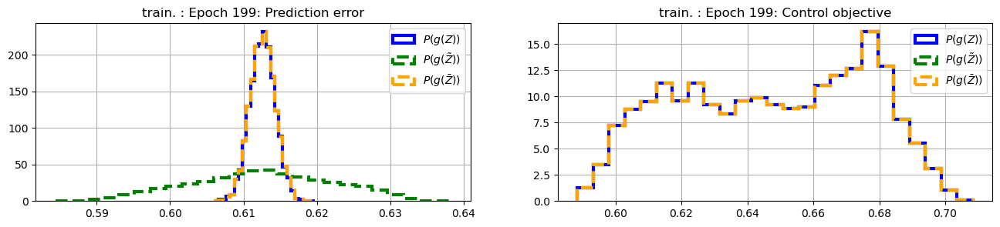

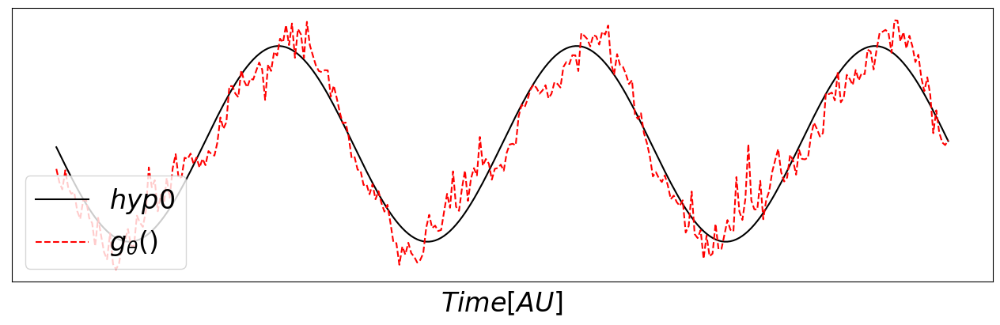

train. dtIRAS  Adam epoch 199: %Selected = 15, CR(zeta=1) = 0.18, CR = 1.0, predictionCorr (mean,std) = 0.968,0.003; ; Pred_error = 0.0646=-11.9 db; Val_error = -9.7 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.946, 0.005


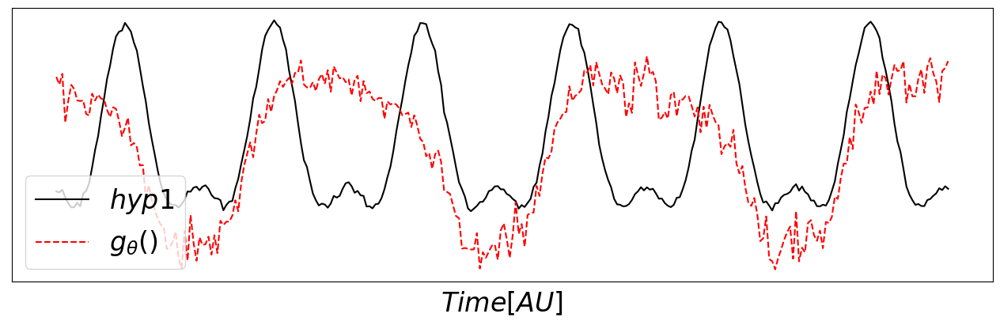

train. dtIRAS  Adam epoch 199: %Selected = 15, CR(zeta=1) = 0.18, CR = 1.0, predictionCorr (mean,std) = 0.968,0.003; ; Pred_error = 0.0646=-11.9 db; Val_error = 1.66 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.266, 0.018
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.266, 0.0


In [31]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

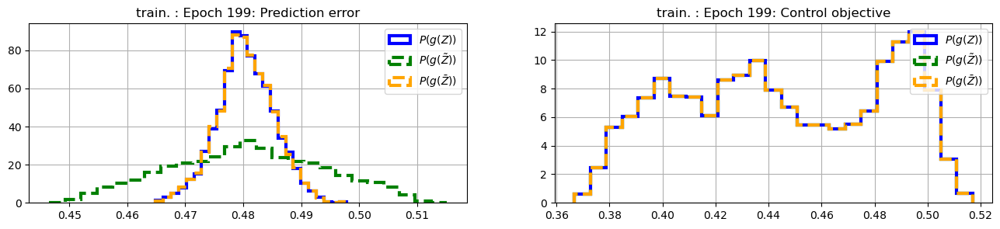

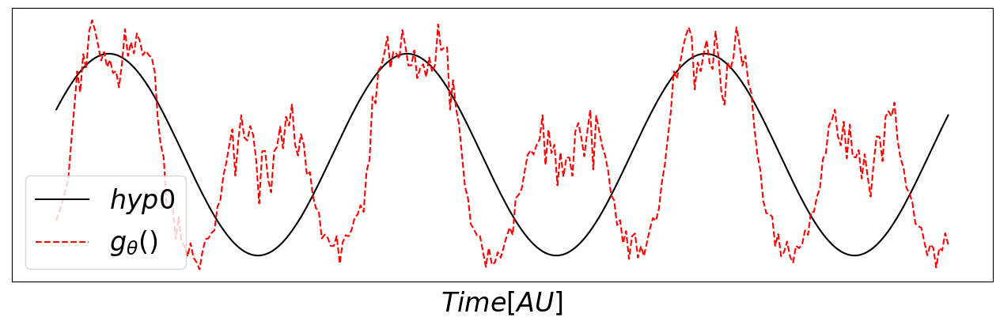

train. dtIRAS  Adam epoch 199: %Selected = 29, CR(zeta=1) = 0.371, CR = 1.002, predictionCorr (mean,std) = 0.864,0.006; ; Pred_error = 0.2714=-5.66 db; Val_error = 0.78 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.4, 0.055


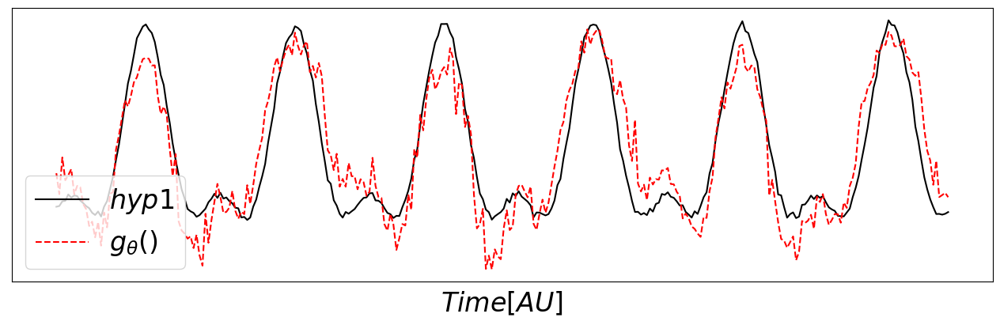

train. dtIRAS  Adam epoch 199: %Selected = 29, CR(zeta=1) = 0.371, CR = 1.002, predictionCorr (mean,std) = 0.864,0.006; ; Pred_error = 0.2714=-5.66 db; Val_error = -5.97 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.873, 0.021
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.873, 0.0


In [32]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

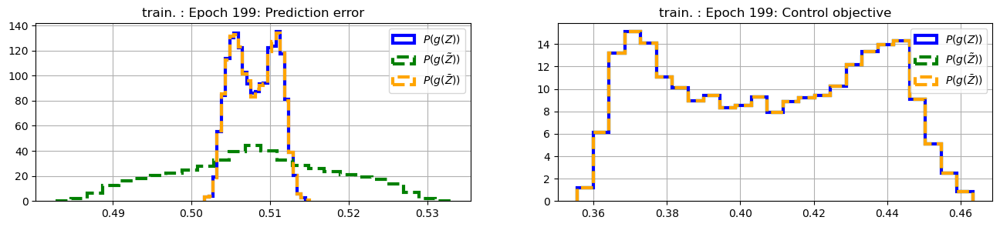

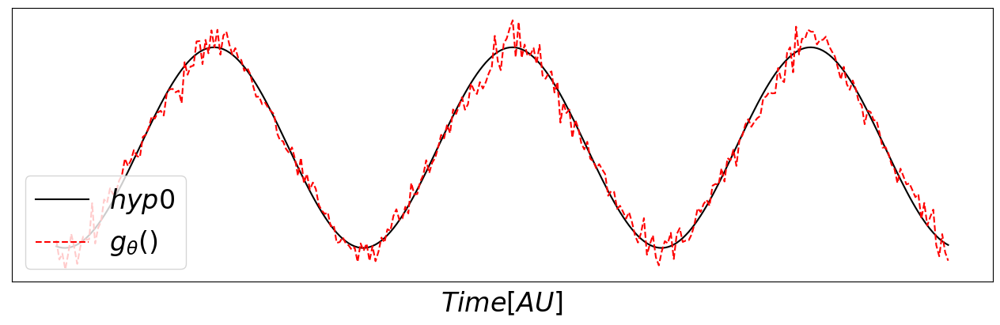

train. dtIRAS  Adam epoch 199: %Selected = 20, CR(zeta=1) = 0.276, CR = 1.0, predictionCorr (mean,std) = 0.923,0.003; ; Pred_error = 0.1536=-8.14 db; Val_error = -15.79 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.987, 0.001


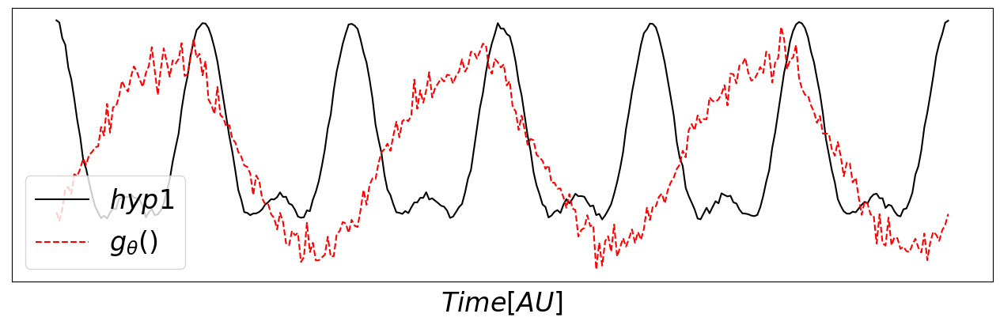

train. dtIRAS  Adam epoch 199: %Selected = 20, CR(zeta=1) = 0.276, CR = 1.0, predictionCorr (mean,std) = 0.923,0.003; ; Pred_error = 0.1536=-8.14 db; Val_error = 2.87 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.031, 0.007
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.031, 0.0


In [33]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

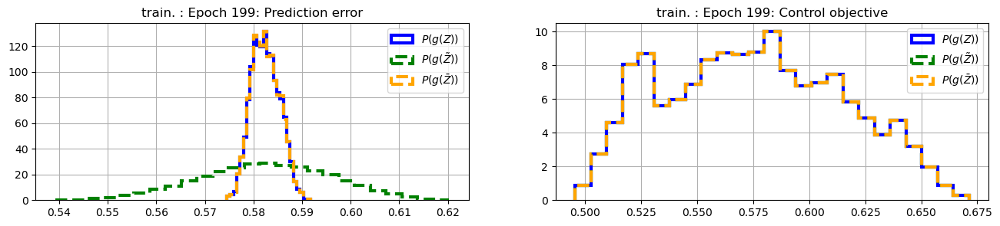

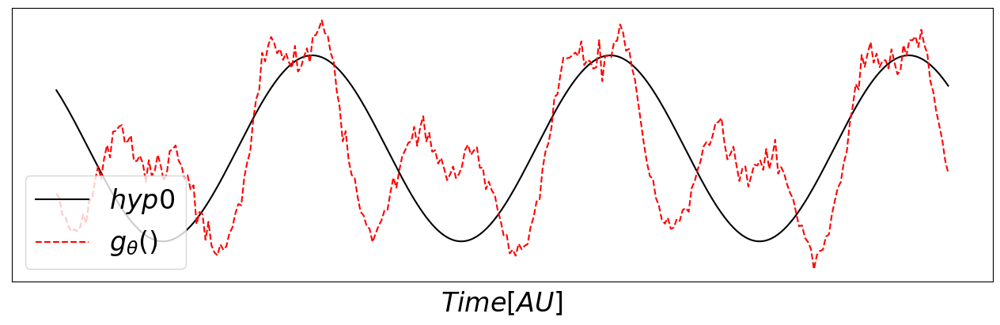

train. dtIRAS  Adam epoch 199: %Selected = 16, CR(zeta=1) = 0.215, CR = 1.003, predictionCorr (mean,std) = 0.954,0.002; ; Pred_error = 0.0919=-10.37 db; Val_error = -0.25 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.527, 0.043


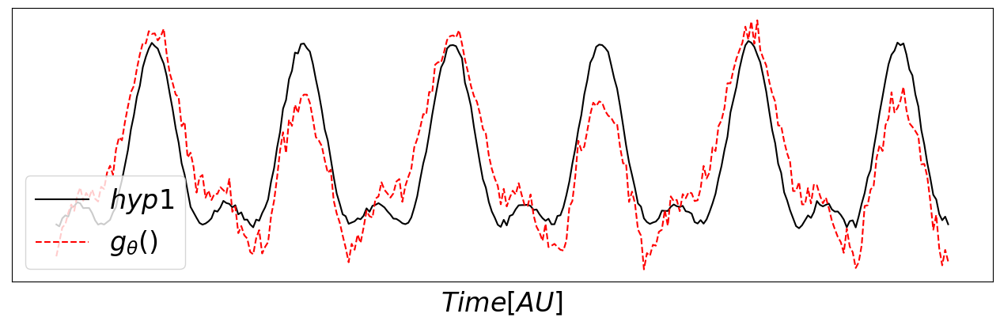

train. dtIRAS  Adam epoch 199: %Selected = 16, CR(zeta=1) = 0.215, CR = 1.003, predictionCorr (mean,std) = 0.954,0.002; ; Pred_error = 0.0919=-10.37 db; Val_error = -4.68 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.829, 0.026
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.829, 0.0


In [34]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

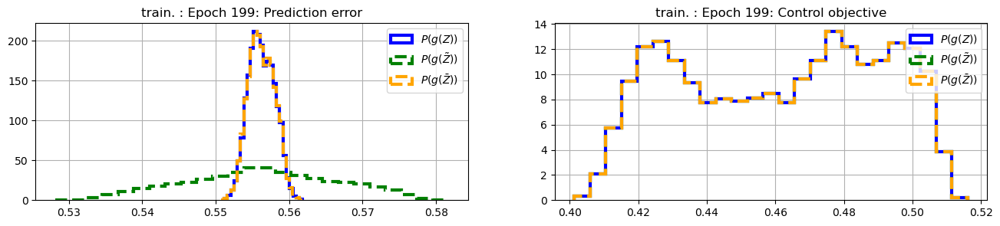

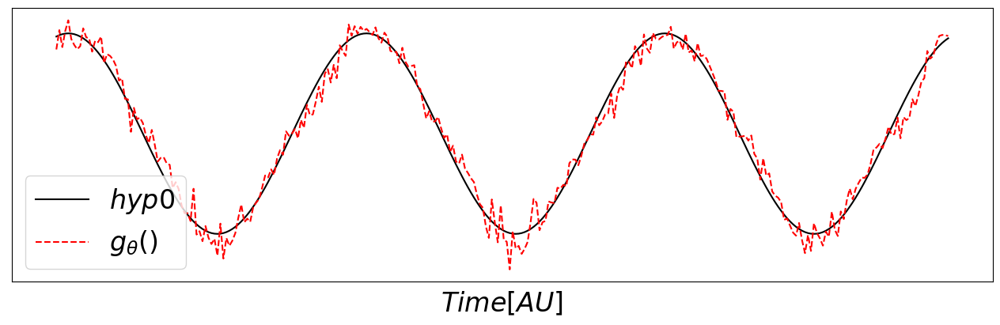

train. dtIRAS  Adam epoch 199: %Selected = 15, CR(zeta=1) = 0.174, CR = 0.999, predictionCorr (mean,std) = 0.969,0.003; ; Pred_error = 0.0617=-12.1 db; Val_error = -12.16 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.968, 0.013


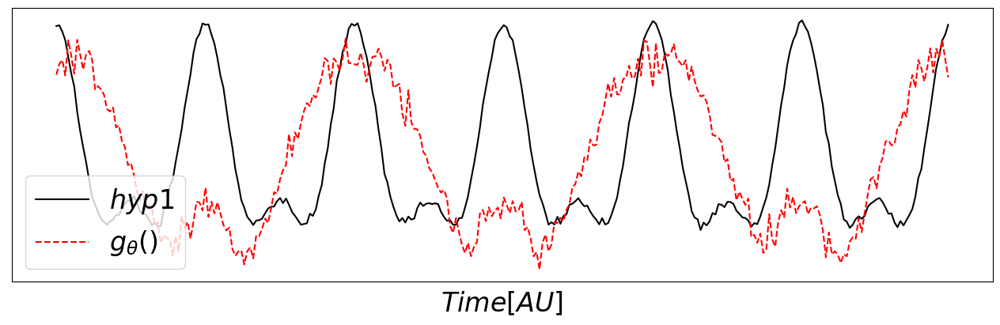

train. dtIRAS  Adam epoch 199: %Selected = 15, CR(zeta=1) = 0.174, CR = 0.999, predictionCorr (mean,std) = 0.969,0.003; ; Pred_error = 0.0617=-12.1 db; Val_error = 2.57 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.095, 0.073
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.095, 0.0


In [35]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

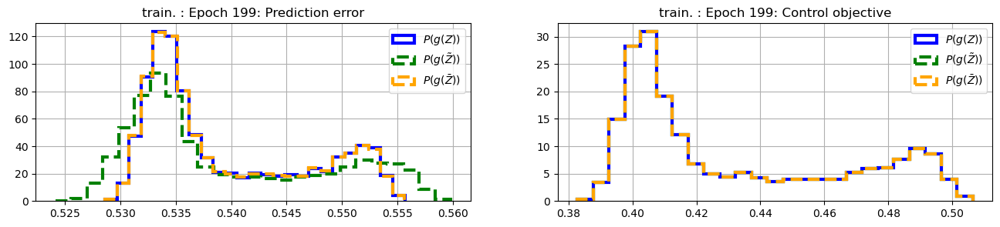

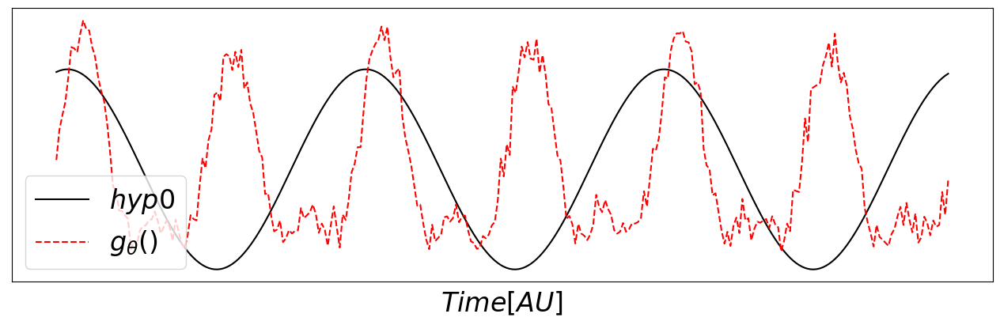

train. dtIRAS  Adam epoch 199: %Selected = 40, CR(zeta=1) = 0.839, CR = 1.001, predictionCorr (mean,std) = 0.776,0.009; ; Pred_error = 0.4478=-3.49 db; Val_error = 2.96 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.012, 0.012


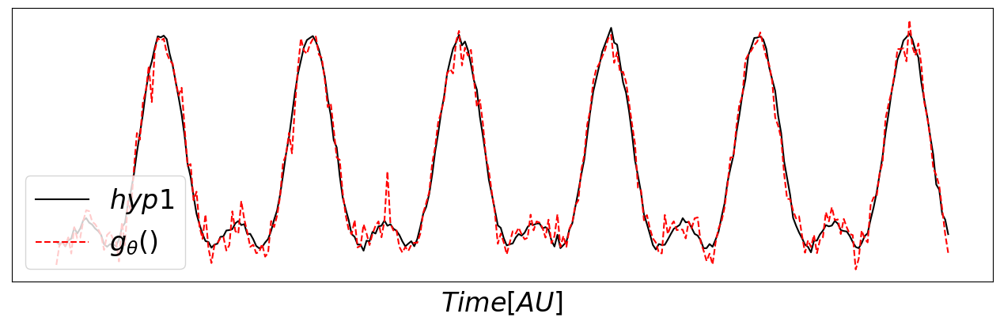

train. dtIRAS  Adam epoch 199: %Selected = 40, CR(zeta=1) = 0.839, CR = 1.001, predictionCorr (mean,std) = 0.776,0.009; ; Pred_error = 0.4478=-3.49 db; Val_error = -15.9 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.987, 0.001
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.987, 0.0


In [36]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

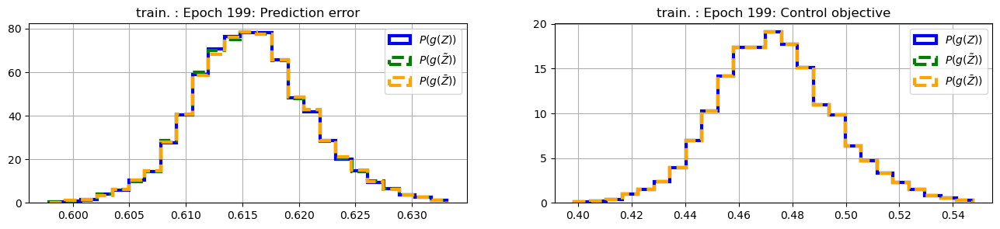

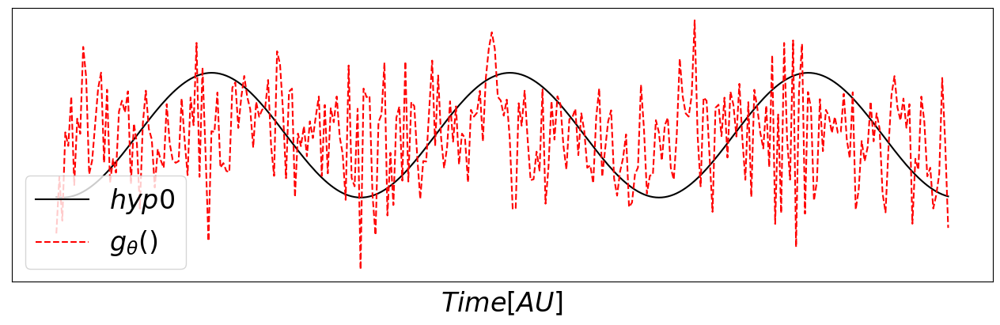

train. dtIRAS  Adam epoch 199: %Selected = 9, CR(zeta=1) = 0.996, CR = 1.0, predictionCorr (mean,std) = -0.02,0.054; ; Pred_error = 1.9013=2.79 db; Val_error = 2.8 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.0, 0.058


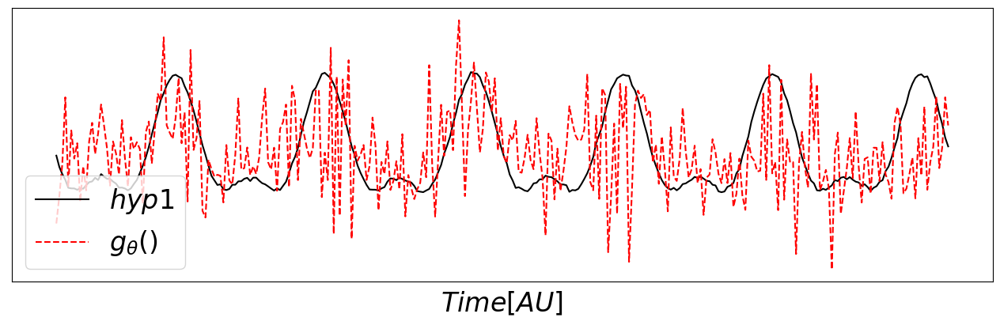

train. dtIRAS  Adam epoch 199: %Selected = 9, CR(zeta=1) = 0.996, CR = 1.0, predictionCorr (mean,std) = -0.02,0.054; ; Pred_error = 1.9013=2.79 db; Val_error = 2.41 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.128, 0.057
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.128, 0.0


In [37]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

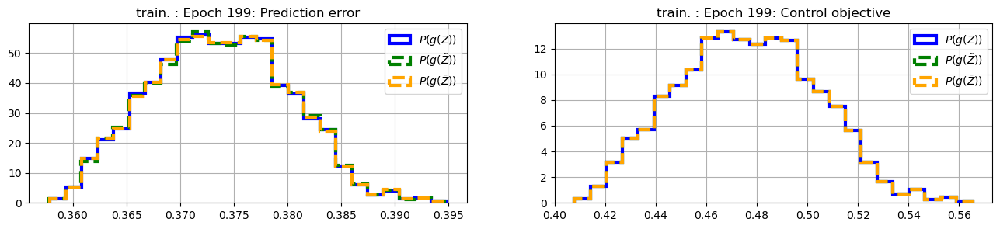

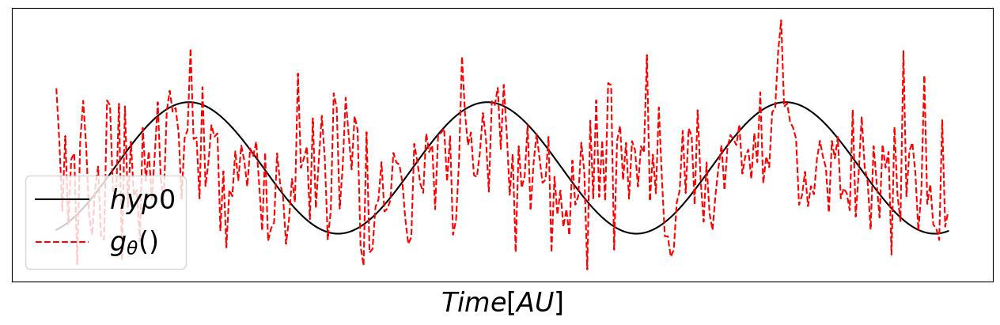

train. dtIRAS  Adam epoch 199: %Selected = 16, CR(zeta=1) = 0.997, CR = 1.001, predictionCorr (mean,std) = 0.024,0.053; ; Pred_error = 1.9052=2.8 db; Val_error = 2.48 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.114, 0.05


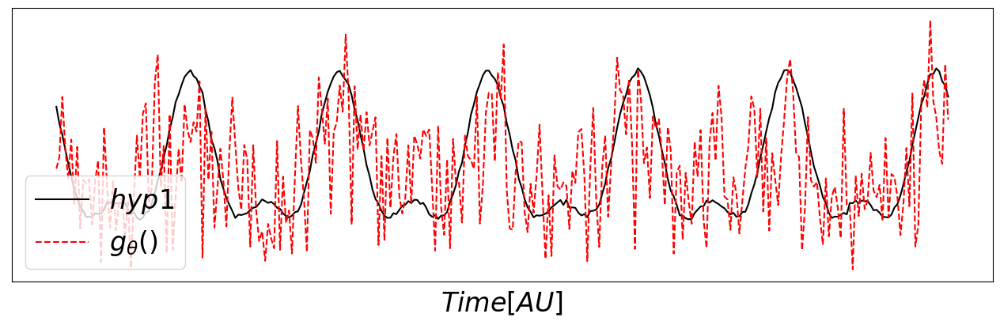

train. dtIRAS  Adam epoch 199: %Selected = 16, CR(zeta=1) = 0.997, CR = 1.001, predictionCorr (mean,std) = 0.024,0.053; ; Pred_error = 1.9052=2.8 db; Val_error = 1.52 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.289, 0.056
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.289, 0.0


In [38]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

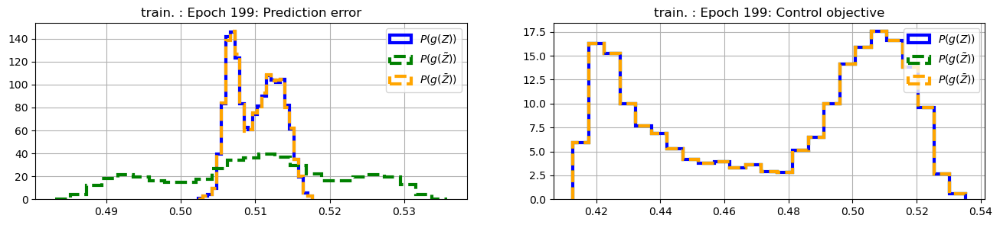

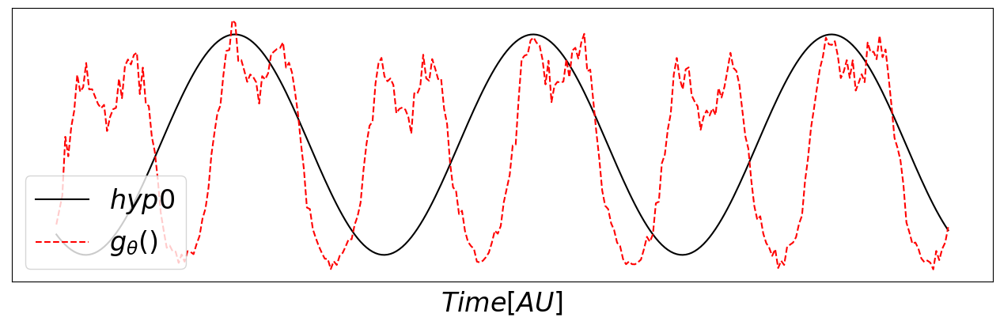

train. dtIRAS  Adam epoch 199: %Selected = 17, CR(zeta=1) = 0.271, CR = 1.0, predictionCorr (mean,std) = 0.967,0.002; ; Pred_error = 0.0666=-11.77 db; Val_error = 2.5 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.111, 0.018


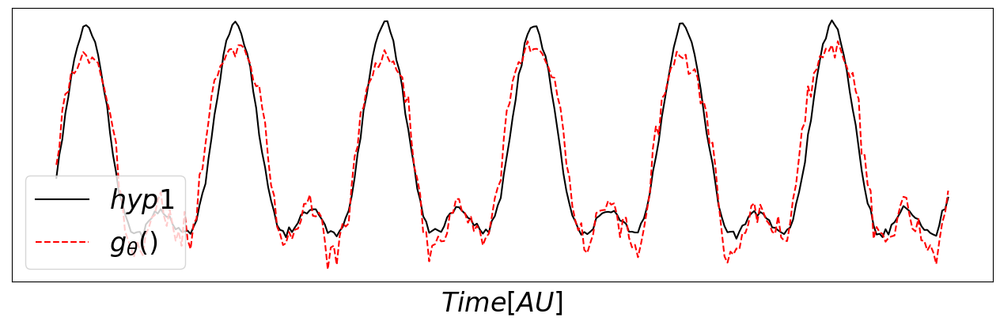

train. dtIRAS  Adam epoch 199: %Selected = 17, CR(zeta=1) = 0.271, CR = 1.0, predictionCorr (mean,std) = 0.967,0.002; ; Pred_error = 0.0666=-11.77 db; Val_error = -11.35 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.963, 0.003
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.963, 0.0


In [39]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

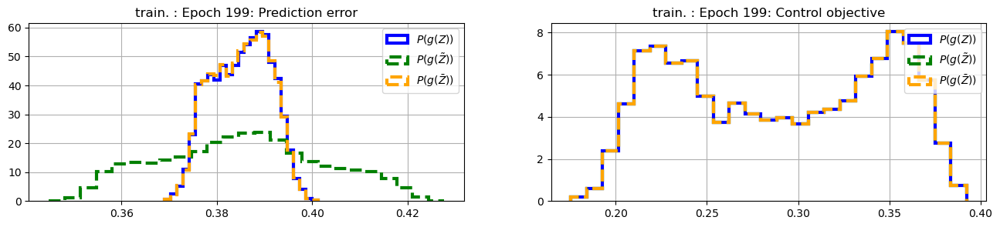

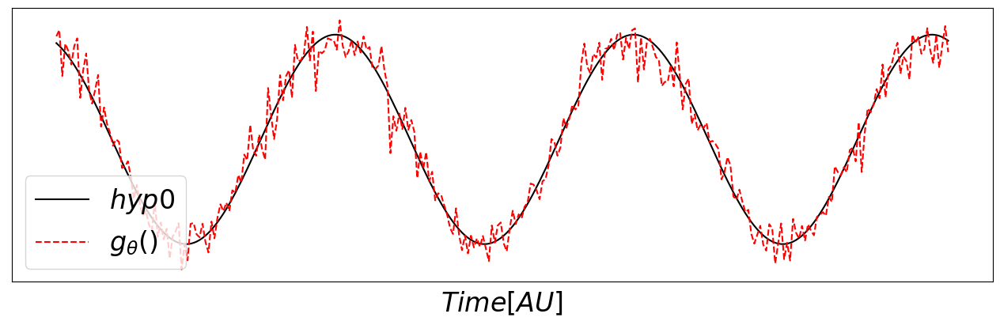

train. dtIRAS  Adam epoch 199: %Selected = 28, CR(zeta=1) = 0.359, CR = 1.001, predictionCorr (mean,std) = 0.903,0.005; ; Pred_error = 0.1931=-7.14 db; Val_error = -12.8 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.974, 0.003


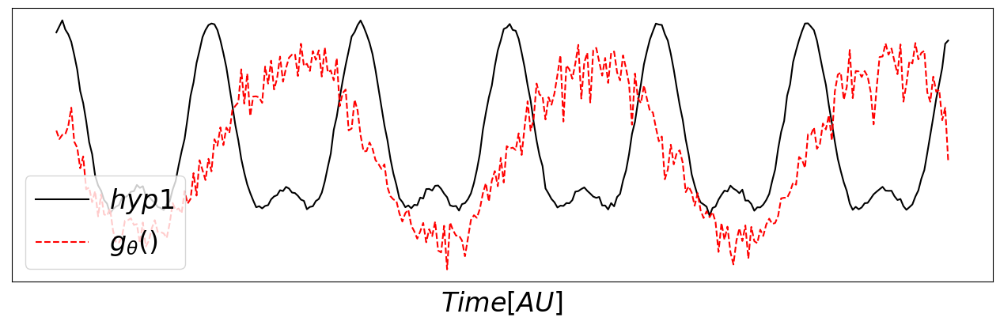

train. dtIRAS  Adam epoch 199: %Selected = 28, CR(zeta=1) = 0.359, CR = 1.001, predictionCorr (mean,std) = 0.903,0.005; ; Pred_error = 0.1931=-7.14 db; Val_error = 2.91 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.01, 0.023
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.01, 0.0


In [40]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

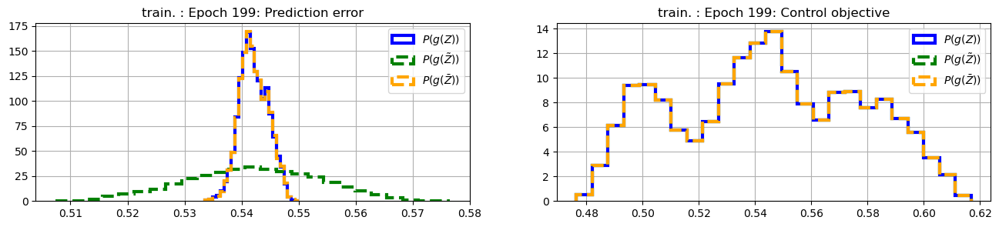

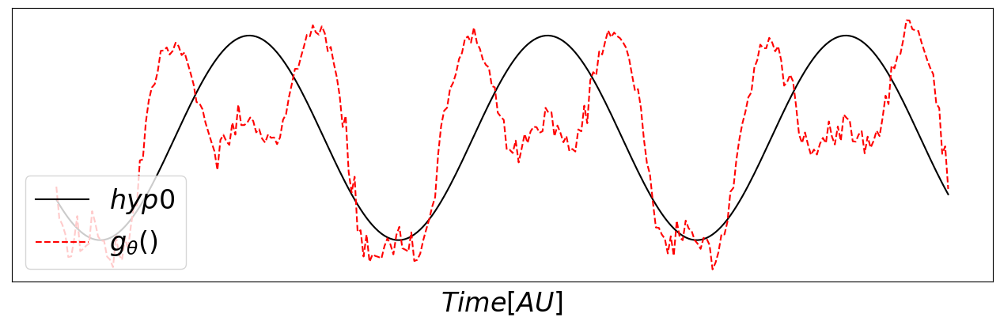

train. dtIRAS  Adam epoch 199: %Selected = 17, CR(zeta=1) = 0.219, CR = 1.001, predictionCorr (mean,std) = 0.952,0.003; ; Pred_error = 0.096=-10.18 db; Val_error = -0.18 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.52, 0.028


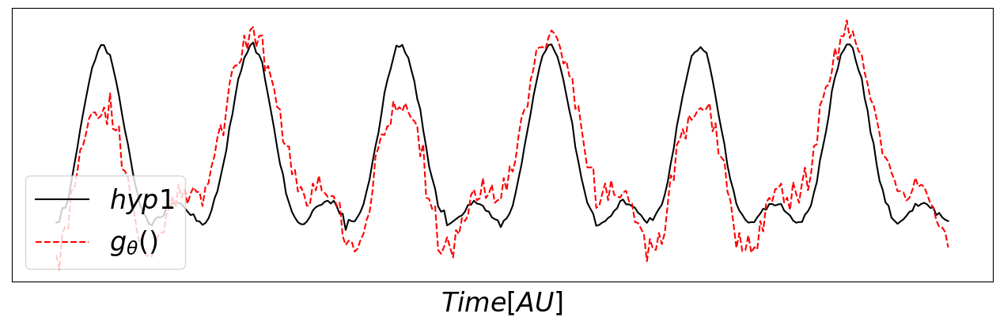

train. dtIRAS  Adam epoch 199: %Selected = 17, CR(zeta=1) = 0.219, CR = 1.001, predictionCorr (mean,std) = 0.952,0.003; ; Pred_error = 0.096=-10.18 db; Val_error = -4.83 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.835, 0.016
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.835, 0.0


In [41]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

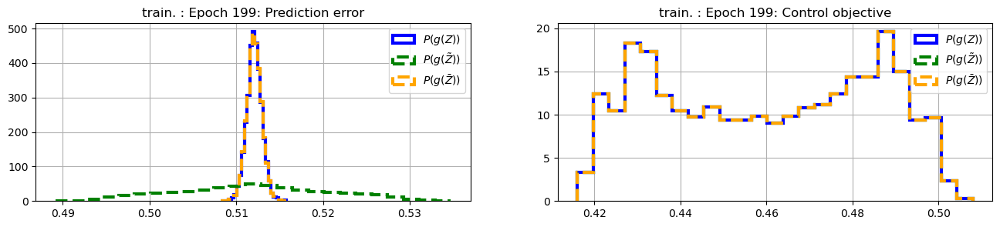

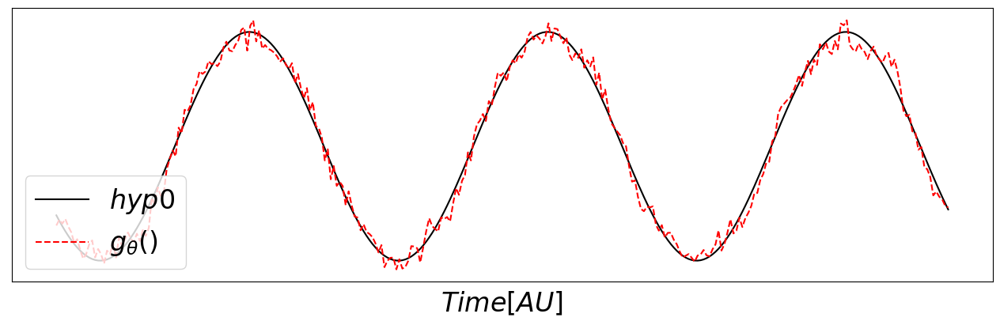

train. dtIRAS  Adam epoch 199: %Selected = 9, CR(zeta=1) = 0.099, CR = 1.004, predictionCorr (mean,std) = 0.99,0.002; ; Pred_error = 0.0198=-17.04 db; Val_error = -17.82 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.992, 0.001


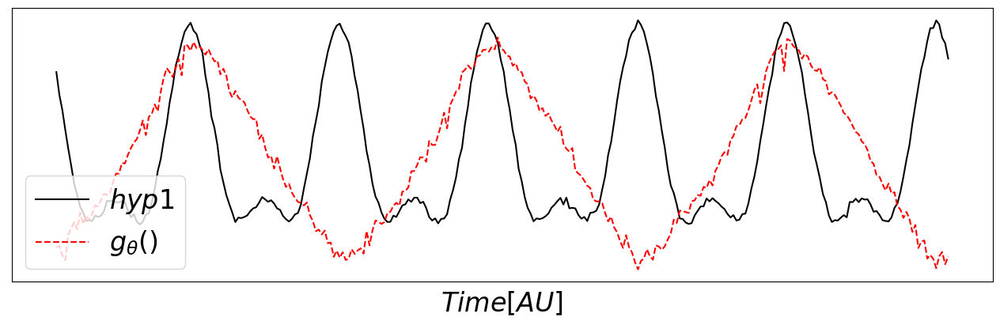

train. dtIRAS  Adam epoch 199: %Selected = 9, CR(zeta=1) = 0.099, CR = 1.004, predictionCorr (mean,std) = 0.99,0.002; ; Pred_error = 0.0198=-17.04 db; Val_error = 2.92 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.02, 0.008
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.02, 0.0


In [42]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

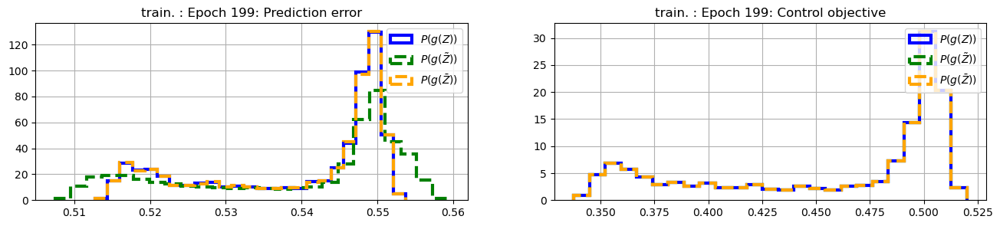

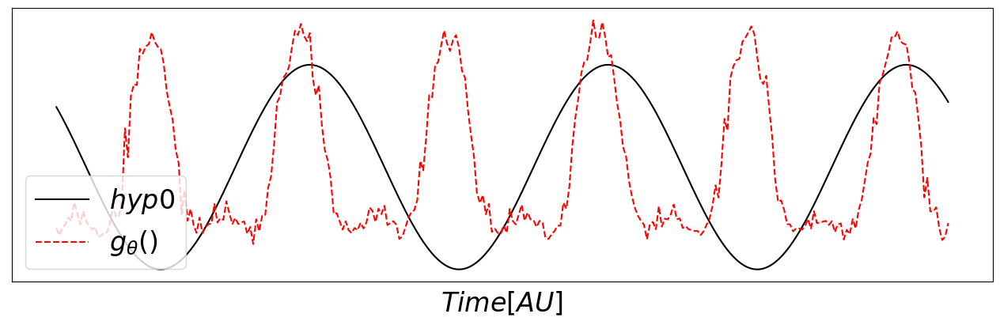

train. dtIRAS  Adam epoch 199: %Selected = 44, CR(zeta=1) = 0.854, CR = 1.0, predictionCorr (mean,std) = 0.859,0.006; ; Pred_error = 0.2828=-5.49 db; Val_error = 2.97 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.008, 0.007


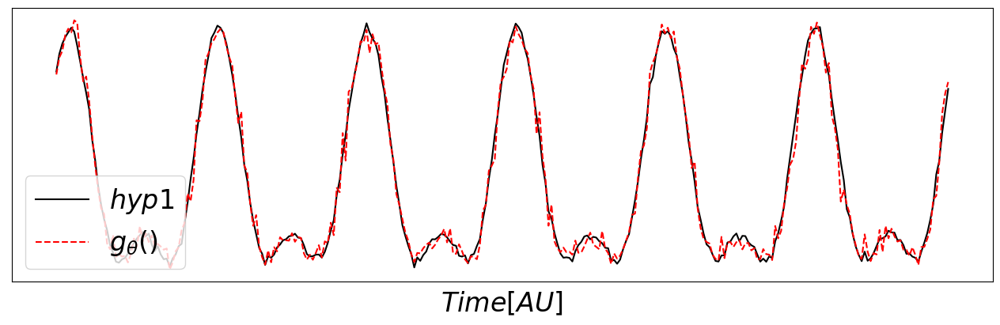

train. dtIRAS  Adam epoch 199: %Selected = 44, CR(zeta=1) = 0.854, CR = 1.0, predictionCorr (mean,std) = 0.859,0.006; ; Pred_error = 0.2828=-5.49 db; Val_error = -18.12 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.992, 0.001
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.992, 0.0


In [43]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

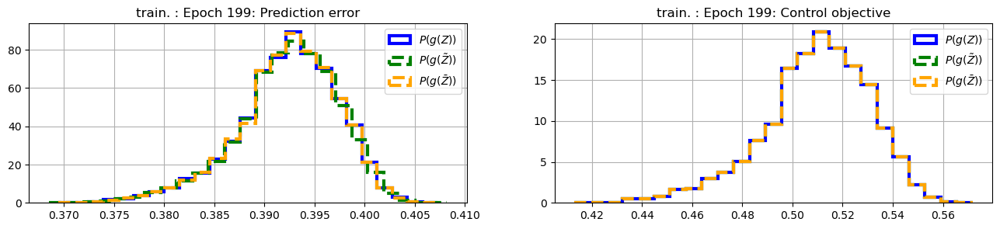

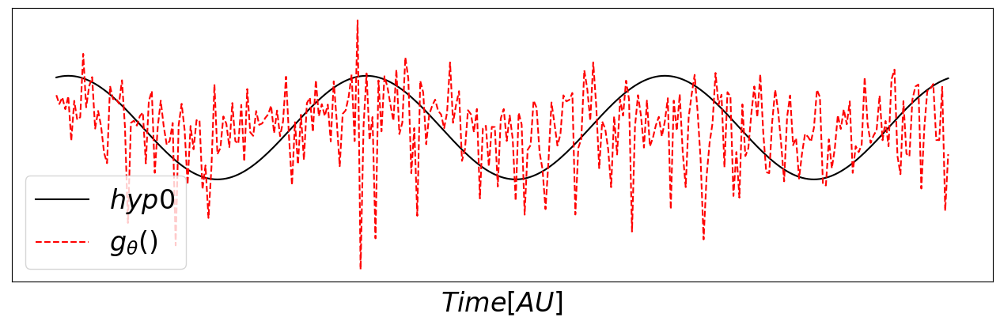

train. dtIRAS  Adam epoch 199: %Selected = 12, CR(zeta=1) = 0.996, CR = 1.0, predictionCorr (mean,std) = 0.012,0.05; ; Pred_error = 1.9278=2.85 db; Val_error = 2.5 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.104, 0.06


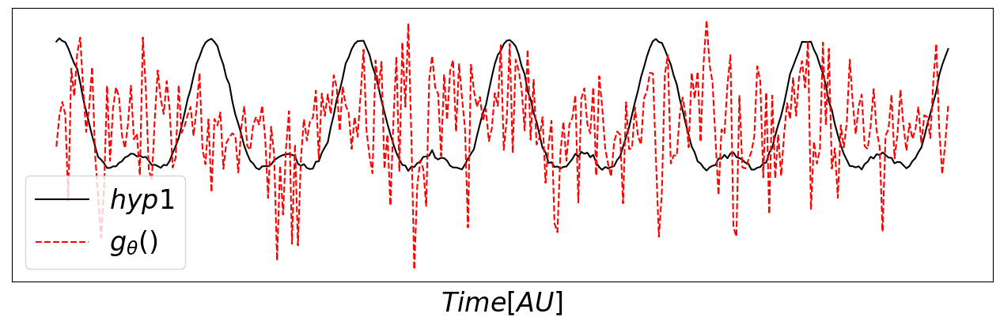

train. dtIRAS  Adam epoch 199: %Selected = 12, CR(zeta=1) = 0.996, CR = 1.0, predictionCorr (mean,std) = 0.012,0.05; ; Pred_error = 1.9278=2.85 db; Val_error = 2.75 db
Pearson correlation between learned combination g() and g^*() (mean,std) = 0.043, 0.053
Pearson correlation between the learned combination g() and the desired g^*() over 1 runs 0.043, 0.0


In [44]:
IRAS_train_script(np.concatenate((observations_I_12_11, observations_I_50_26), axis=2).copy(), observations_tVec_I_12_11.copy(), np.concatenate((V_I_12_11, V_I_50_26),axis=2).copy(), nativeIRAS=False)

Results:

1. Pred_error = 0.06, hyp0_corr = 0.984, hyp1_corr = 0.084
2. 
3. 


